# Comparison cluster maps

In [1]:
import numpy as np
import healpy as hp
import matplotlib.pyplot as plt
%matplotlib inline
import astropy.units as u
from astropy.coordinates import SkyCoord

from iminuit import Minuit
from iminuit.cost import LeastSquares

from simulMap import *

In [2]:
#resolution:
NSIDE = 64
NPIX = hp.nside2npix(NSIDE)
print("Number of pixels = {}".format(NPIX))

#sources:
NSource_px_th = int(1e6)
print("Total number of sources in the entire sky : {}".format(NSource_px_th*NPIX))
print("Theorical number of sources in one pixel : {}".format(NSource_px_th))

Number of pixels = 49152
Total number of sources in the entire sky : 49152000000
Theorical number of sources in one pixel : 1000000


## Power spectrum

/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.221e+05 (χ²/ndof = 4.5)  │              Nfcn = 382              │
│ EDM = 4.85e-05 (Goal: 0.0002)    │            time = 3.7 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 999.995e3 │  0.005e3  │  -0.005e3  │  0.004e3   │    0    │         │       │
│ 1 │ A    │  2.724e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │  107.84   │   0.19    │   -0.19    │    0.19    │    0    │   360   │       │
│ 3 │ b    │   29.14   │   0.16    │   -0.16    │    0.16    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     4     │    -8     │     8     │   -0.19   │   0.19    │   -0.16   │   0.16    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────┐
│   │      M      A      l      b │
├───┼─────────────────────────────┤
│ M │   20.3      0 -0.000  0.000 │
│ A │      0     61 -0.000 -0.000 │
│ l │ -0.000 -0.000 0.0354 -0.000 │
│ b │  0.000 -0.000 -0.000  0.027 │
└───┴─────────────────────────────┘

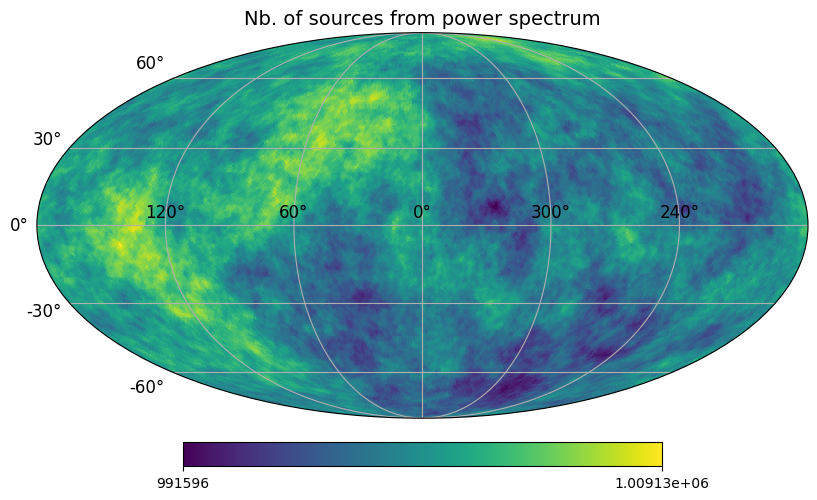

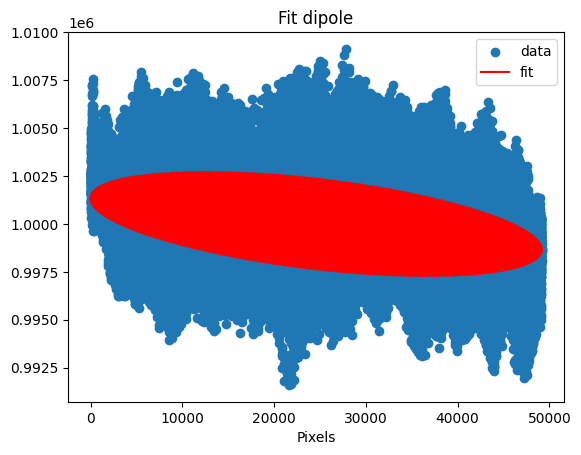

In [3]:
def get_Cl_bardeen(lmax, n_s=0.96, Om=0.31, Ob=0.048, h=0.67, khi=1):
    ell = np.arange(lmax + 1) #mutipole l (use "ell" rather than "l" by convention)
    ell = (ell + 1/2)/khi #it's k in Limber approcimation, but I called it ell to not create new variable
    gamma = Om * h * np.exp(-Ob - np.sqrt(2 * h) * (Ob / Om)) #Modern shape parameter (Sugiyama's gamma)
    q = ell / gamma
    transfer_function = np.log(1 + 2.34*q) / (2.34*q) * \
                        (1 + 3.89*q + (16.1*q)**2 + (5.46*q)**3 + (6.71*q)**4)**(-0.25)
    Cl = ell**n_s * transfer_function**2 #angular power spectrum C_l
    Cl[0] = 0 # No monopole
    return ell, Cl/(khi**2)


def generate_healpix_count_map(nside, mean_counts, args=(0.96, 0.31, 0.048, 0.67), Cl_model=get_Cl_bardeen, normalize_gauss=False, lognormal=True):
    """
    Return a count map from the power spectrum.
    n_s: spectral index
    Om, Ob, h: cosmological parameters
    """
    # Multipoles l:
    lmax = 3 * nside - 1 #resolution
    ell, Cl = Cl_model(lmax, *args)

    # Gaussian field generation
    delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform
    if normalize_gauss: delta_spherical = (delta_spherical - np.mean(delta_spherical)) / np.std(delta_spherical) #normalisation
    if lognormal: density_field = np.exp(delta_spherical - 0.5 * np.var(delta_spherical)) #Log-Normale transformation
    else: density_field = delta_spherical #keeping only gaussian field rather converting it into lognormal field
    
    # Map creation
    count_map = mean_counts * density_field
    #count_map = np.random.poisson(count_map).astype(float)

    return count_map

nest = False
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th)
title="Nb. of sources from power spectrum"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

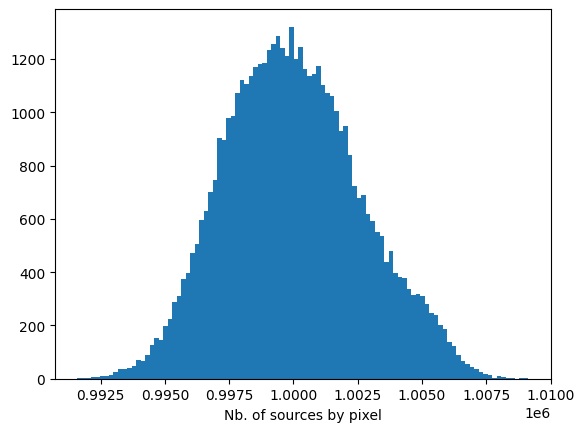

In [4]:
var, bins = get_hist(NSource_px_Cl, bins=100)

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.685e+07 (χ²/ndof = 376028.9)│              Nfcn = 105              │
│ EDM = 1.35e-06 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ A     │ 8.69646e6 │ 0.00016e6 │ -0.00016e6 │ 0.00016e6  │         │         │       │
│ 1 │ mu    │  1.00e6   │  0.01e6   │            │            │         │         │  yes  │
│ 2 │ sigma │ 2.74271e3 │ 0.00006e3 │ -0.00006e3 │ 0.00006e3  │         │         │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┐
│          │           A           │         sigma         │
├──────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.16e3  │  0.16e3   │   -0.06   │   0.06    │
│  Valid   │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┘
┌───────┬────────────────────────────┐
│       │        A       mu    sigma │
├───────┼────────────────────────────┤
│     A │ 2.53e+04        0   5.2138 │
│    mu │        0        0   0.0000 │
│ sigma │   5.2138   0.0000  0.00329 │
└───────┴────────────────────────────┘

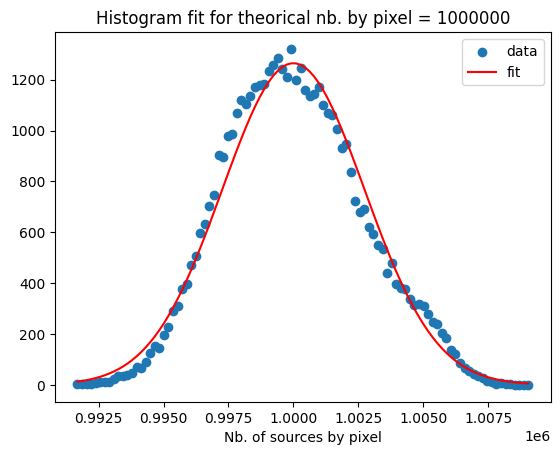

In [5]:
m = fit_minuit(bins, var, 0.1, gauss, (4e6, NSource_px_th, np.sqrt(NSource_px_th)), ("A", "mu", "sigma"),
              title="Histogram fit for theorical nb. by pixel = {}".format(NSource_px_th), xlabel="Nb. of sources by pixel", fixed=['mu'])
m

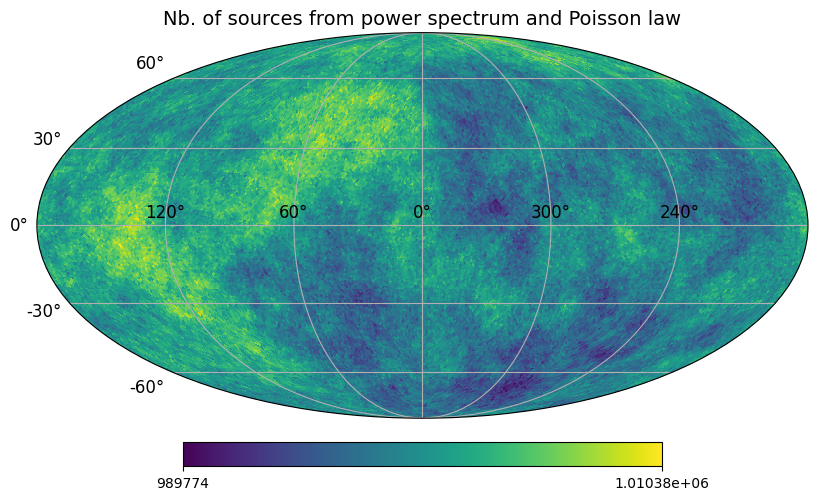

In [6]:
NSource_px_Cl = np.random.poisson(NSource_px_Cl)
title="Nb. of sources from power spectrum and Poisson law"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "PoissVar")

/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.313e+08 (χ²/ndof = 4706.2)│              Nfcn = 594              │
│ EDM = 0.0015 (Goal: 0.0002)      │            time = 5.0 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 995.294e3 │  0.005e3  │  -0.004e3  │  0.004e3   │    0    │         │       │
│ 1 │ A    │    81     │     8     │     -8     │     8      │    0    │         │       │
│ 2 │ l    │    255    │    18     │    -18     │     18     │    0    │   360   │       │
│ 3 │ b    │    71     │     6     │     -6     │     6      │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     4     │    -8     │     8     │    -18    │    18     │    -6     │     6     │
│  Valid   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────┐
│   │    M    A    l    b │
├───┼─────────────────────┤
│ M │ 20.2    0   -0   -0 │
│ A │    0 61.3  -10   -1 │
│ l │   -0  -10  331   26 │
│ b │   -0   -1   26 32.5 │
└───┴─────────────────────┘

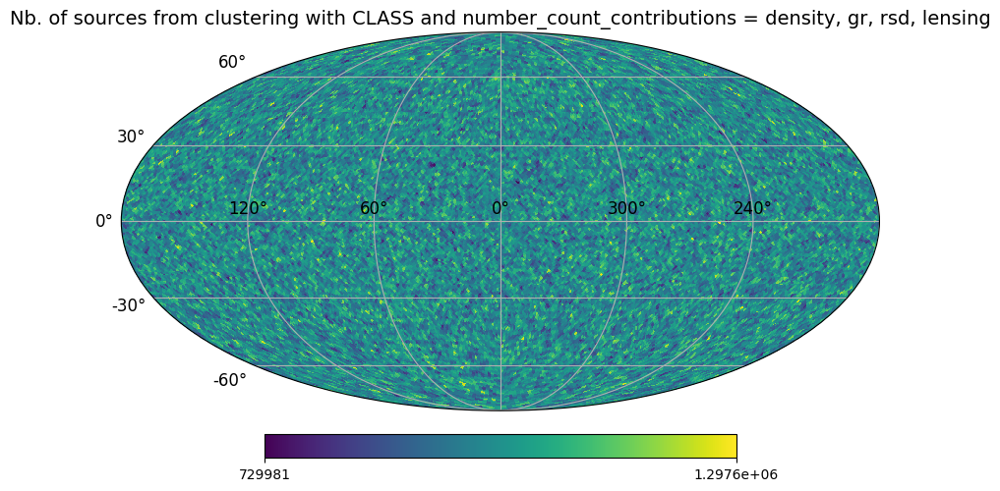

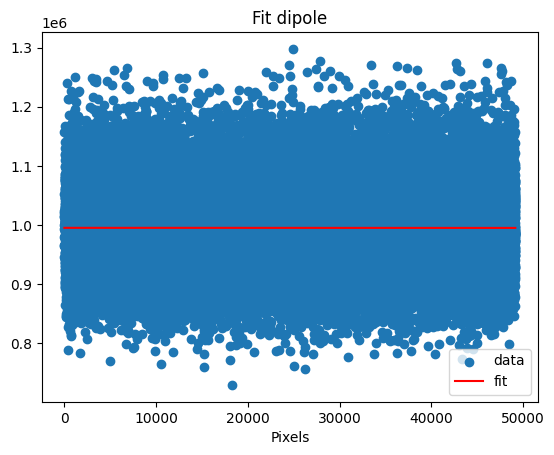

In [7]:
from classy import Class
contrib = "density, gr, rsd, lensing"
class_settings = {
    "h": 0.675,
    "Omega_b": 0.0487,
    "Omega_cdm": 0.2613,
    "k_pivot": 0.05,
    "sigma8": 0.83,
    "n_s": 0.96,

    "output": "dCl",
    "z_max_pk": 10,
    "l_max_lss": 1000,
    "number_count_contributions": contrib,
}

def get_Cl_Class(lmax, class_settings, key0='dd', key1='dens[1]-dens[1]'):
    model = Class()
    model.set(class_settings)
    model.compute()
    
    lmax = 3 * NSIDE - 1
    density_Cl = model.density_cl(lmax=lmax)[key0][key1]
    ell = model.density_cl(lmax=lmax)["ell"]
    return ell, density_Cl

NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, args=(class_settings,), Cl_model=get_Cl_Class)
hp.projview(NSource_px_Cl, title=f"Nb. of sources from clustering with CLASS and number_count_contributions = {contrib}", graticule=True, graticule_labels=True);

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


Unable to use minos()


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.761e+08 (χ²/ndof = 3582.0)│              Nfcn = 172              │
│ EDM = 2.39e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│           Hesse FAILED           │       Covariance NOT pos. def.       │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 9.9644e5  │ 0.0000e5  │            │            │    0    │         │       │
│ 1 │ A    │ 1.1326e3  │ 0.0000e3  │            │            │    0    │         │       │
│ 2 │ l    │  1.0109   │  0.0000   │            │            │    0    │   360   │       │
│ 3 │ b    │    9e1    │    0e1    │            │            │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘

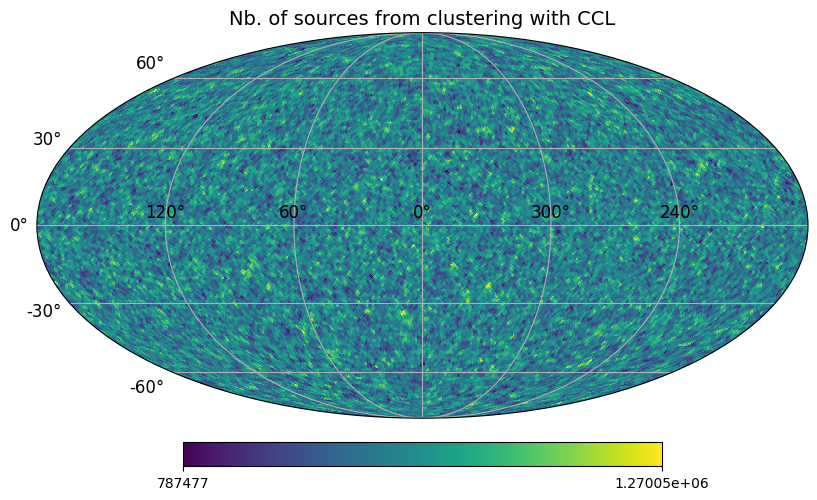

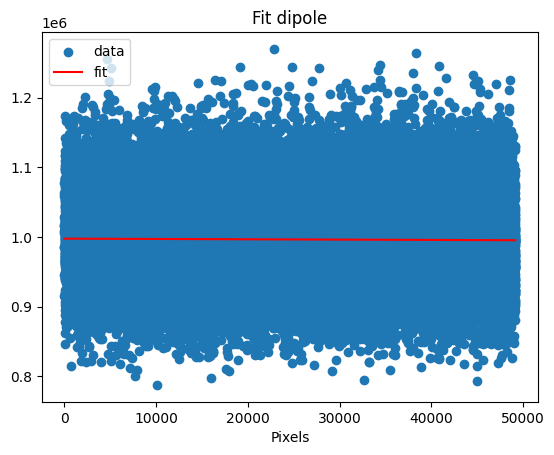

In [8]:
import pyccl as ccl

def get_Cl_ccl(lmax, Omega_c=0.25, Omega_b=0.05, h=0.67, sigma8=0.8, n_s=0.96, z=np.linspace(0.01, 1.0, 200)):
    cosmo = ccl.Cosmology(#transfer_function='boltzmann_class',
        Omega_c=Omega_c,
        Omega_b=Omega_b,
        h=h,
        sigma8=sigma8,
        n_s=n_s
    )

    nz = np.exp(-((z - 0.5)**2) / 0.1)
    nz = z**2 * np.exp(-(z/0.5)**1.5)
    nz /= np.trapz(nz, z)
    
    tracer = ccl.NumberCountsTracer(
        cosmo,
        has_rsd=True,
        dndz=(z, nz),
        bias=(z, np.ones_like(z))
    )
    
    ell = np.arange(lmax + 1)
    cl = ccl.angular_cl(cosmo, tracer, tracer, ell)
    
    return ell, cl

NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, args=(0.25, 0.05, 0.67, 0.8, 0.96, np.linspace(0.01, 1.0, 200)), Cl_model=get_Cl_ccl)
hp.projview(NSource_px_Cl, title="Nb. of sources from clustering with CCL", graticule=True, graticule_labels=True);

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

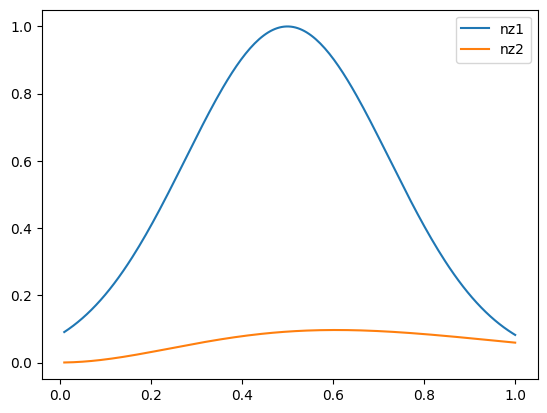

In [9]:
z=np.linspace(0.01, 1.0, 200)
nz1 = np.exp(-((z - 0.5)**2) / 0.1)
nz2= z**2 * np.exp(-(z/0.5)**1.5)
plt.plot(z, nz1, label="nz1")
plt.plot(z, nz2, label="nz2")
plt.legend();

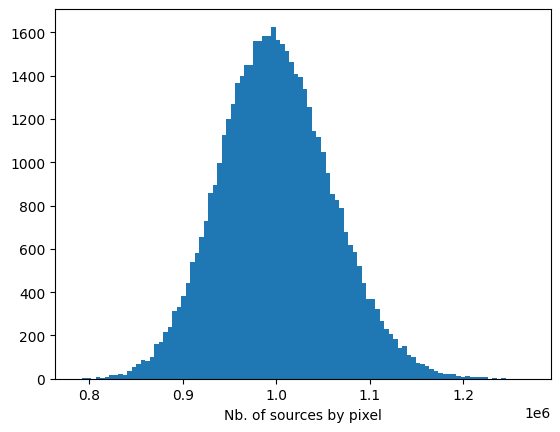

In [10]:
var, bins = get_hist(NSource_px_Cl, bins=100)

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.464e+07 (χ²/ndof = 149413.2)│              Nfcn = 117              │
│ EDM = 3.25e-07 (Goal: 0.0002)    │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬───────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name  │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼───────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ A     │ 236.880e6 │  0.004e6  │  -0.004e6  │  0.004e6   │         │         │       │
│ 1 │ mu    │  1.00e6   │  0.01e6   │            │            │         │         │  yes  │
│ 2 │ sigma │ 59.6067e3 │ 0.0011e3  │ -0.0011e3  │  0.0011e3  │         │         │       │
└───┴───────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┐
│          │           A           │         sigma         │
├──────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │   -4e3    │    4e3    │   -1.1    │    1.1    │
│  Valid   │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┘
┌───────┬────────────────────────────┐
│       │        A       mu    sigma │
├───────┼────────────────────────────┤
│     A │ 1.53e+07        0 2.5722e3 │
│    mu │        0        0      0.0 │
│ sigma │ 2.5722e3      0.0     1.29 │
└───────┴────────────────────────────┘

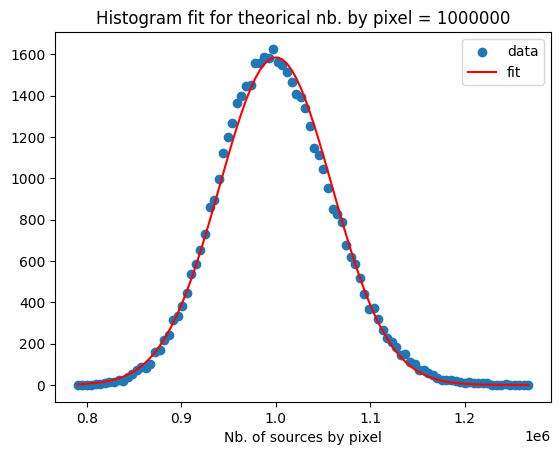

In [11]:
m = fit_minuit(bins, var, 0.1, gauss, (4e6, NSource_px_th, np.sqrt(NSource_px_th)), ("A", "mu", "sigma"),
              title="Histogram fit for theorical nb. by pixel = {}".format(NSource_px_th), xlabel="Nb. of sources by pixel", fixed=['mu'])
m

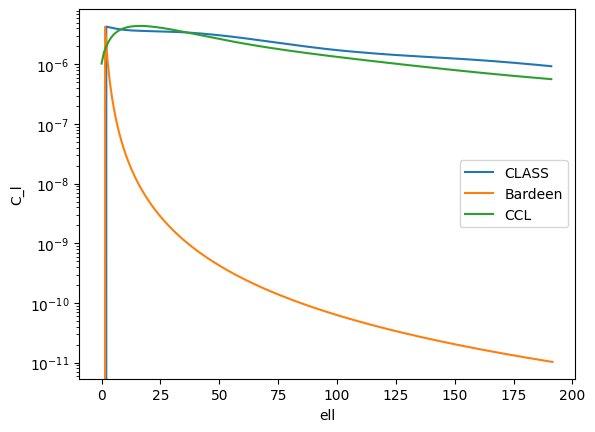

In [12]:
lmax = 3*NSIDE - 1
ell_class, Cl_class = get_Cl_Class(lmax, class_settings)
ell_bard, Cl_bard = get_Cl_bardeen(lmax, n_s=class_settings['n_s'], Om=class_settings['Omega_cdm'], Ob=class_settings['Omega_b'], h=class_settings['h'])
ell_ccl, Cl_ccl = get_Cl_ccl(lmax, 0.25, 0.05, 0.67, 0.8, 0.96, np.linspace(0.01, 1.0, 200))

fig, ax = plt.subplots()
ax.plot(ell_class, Cl_class, label='CLASS')
ax.plot(ell_bard, Cl_bard, label='Bardeen')
ax.plot(ell_ccl, Cl_ccl, label='CCL')
ax.set_xlabel('ell')
ax.set_ylabel('C_l')
ax.set_yscale('log')
ax.legend();

/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


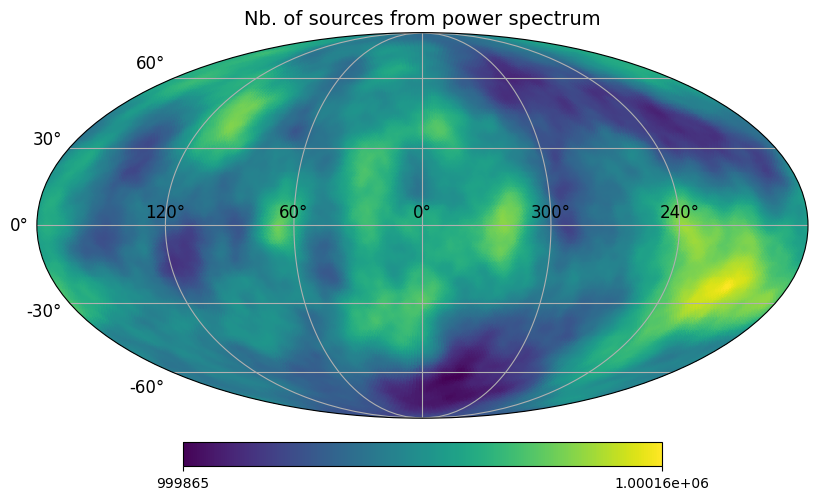

In [13]:
class_settings = {
    "h": 0.675,
    "Omega_b": 0.0487,
    "Omega_cdm": 0.2613,
    "k_pivot": 0.05,
    "sigma8": 0.83,
    "n_s": 0.96,

    "output": "sCl",
    "z_max_pk": 10,
    "l_max_lss": 1000,
    #"number_count_contributions": "density",
}


NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, args=(class_settings, 'll', 'lens[1]-lens[1]'), Cl_model=get_Cl_Class)
hp.projview(NSource_px_Cl, title="Nb. of sources from power spectrum", graticule=True, graticule_labels=True);

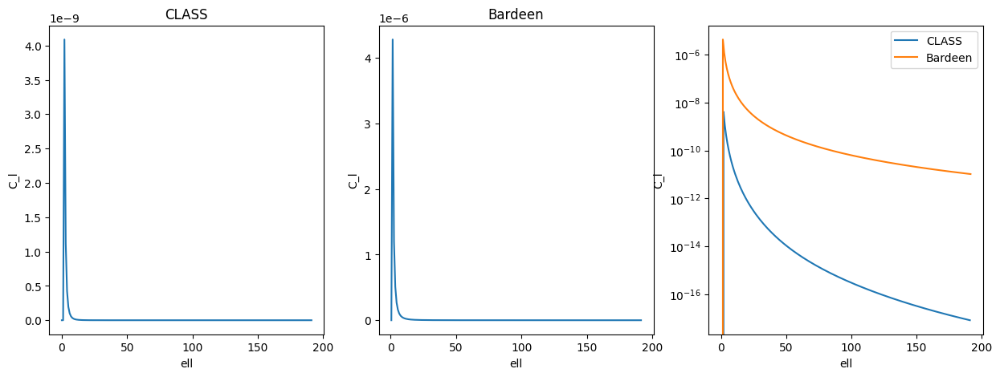

In [14]:
lmax = 3*NSIDE - 1
ell_class, Cl_class = get_Cl_Class(lmax, class_settings, 'll', 'lens[1]-lens[1]')
ell_bard, Cl_bard = get_Cl_bardeen(lmax, n_s=class_settings['n_s'], Om=class_settings['Omega_cdm'], Ob=class_settings['Omega_b'], h=class_settings['h'])

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].plot(ell_class, Cl_class)
ax[0].set_xlabel('ell')
ax[0].set_ylabel('C_l')
ax[0].set_title('CLASS')
ax[1].plot(ell_bard, Cl_bard)
ax[1].set_xlabel('ell')
ax[1].set_ylabel('C_l')
ax[1].set_title('Bardeen')
ax[2].plot(ell_class, Cl_class, label='CLASS')
ax[2].plot(ell_bard, Cl_bard, label='Bardeen')
ax[2].set_xlabel('ell')
ax[2].set_ylabel('C_l')
ax[2].set_yscale('log')
ax[2].legend();

## Studying of different versions

### 1) Field without monopole (i.e. with $N_{mean} = 1$)

#### Lognormal field:

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 0.2585 (χ²/ndof = 0.0)     │              Nfcn = 515              │
│ EDM = 1.33e-05 (Goal: 0.0002)    │            time = 4.9 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │   1.000   │   0.005   │   -0.005   │   0.005    │    0    │         │       │
│ 1 │ A    │   0.004   │   0.008   │   -0.004   │   0.008    │    0    │         │       │
│ 2 │ l    │ 359.9995  │ 307.2565  │ -359.9995  │   0.0005   │    0    │   360   │       │
│ 3 │ b    │    10     │    130    │    -100    │     80     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.005   │   0.005   │  -0.004   │   0.008   │-359999.5e-3│  0.5e-3   │   -100    │    80     │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   True    │   False   │   True    │   True    │   True    │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────┐
│   │         M         A         l         b │
├───┼─────────────────────────────────────────┤
│ M │  2.03e-05         0        -0 -0.014e-3 │
│ A │         0   6.1e-05        -0  -5.61e-3 │
│ l │        -0        -0     0.746       0.0 │
│ b │ -0.014e-3  -5.61e-3       0.0  9.53e+03 │
└───┴─────────────────────────────────────────┘

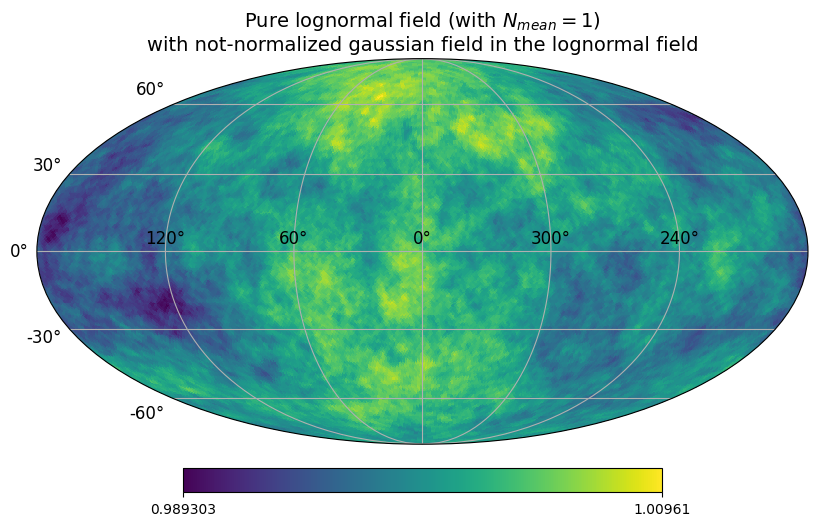

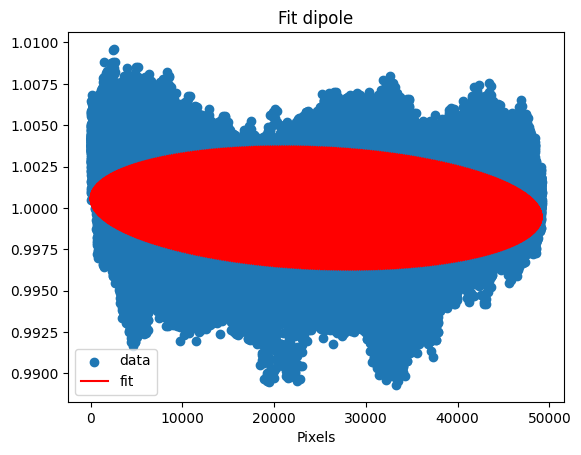

In [10]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, 1, normalize_gauss = False)
title="Nb. of sources from power spectrum"
title = "Pure lognormal field (with $N_{mean} = 1$)\nwith not-normalized gaussian field in the lognormal field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.957e+04 (χ²/ndof = 0.6)  │              Nfcn = 467              │
│ EDM = 3.7e-07 (Goal: 0.0002)     │            time = 3.8 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │  0.4068   │  0.0029   │  -0.0029   │   0.0029   │    0    │         │       │
│ 1 │ A    │   0.209   │   0.005   │   -0.005   │   0.005    │    0    │         │       │
│ 2 │ l    │   77.5    │    2.2    │    -2.1    │    2.2     │    0    │   360   │       │
│ 3 │ b    │   44.7    │    1.2    │    -1.2    │    1.2     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.0029  │  0.0029   │  -0.005   │   0.005   │   -2.1    │    2.2    │   -1.2    │    1.2    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────┐
│   │         M         A         l         b │
├───┼─────────────────────────────────────────┤
│ M │  8.28e-06      4e-6     -1e-6      0e-6 │
│ A │      4e-6  2.73e-05 -0.118e-3  1.522e-3 │
│ l │     -1e-6 -0.118e-3      4.66       0.4 │
│ b │      0e-6  1.522e-3       0.4      1.45 │
└───┴─────────────────────────────────────────┘

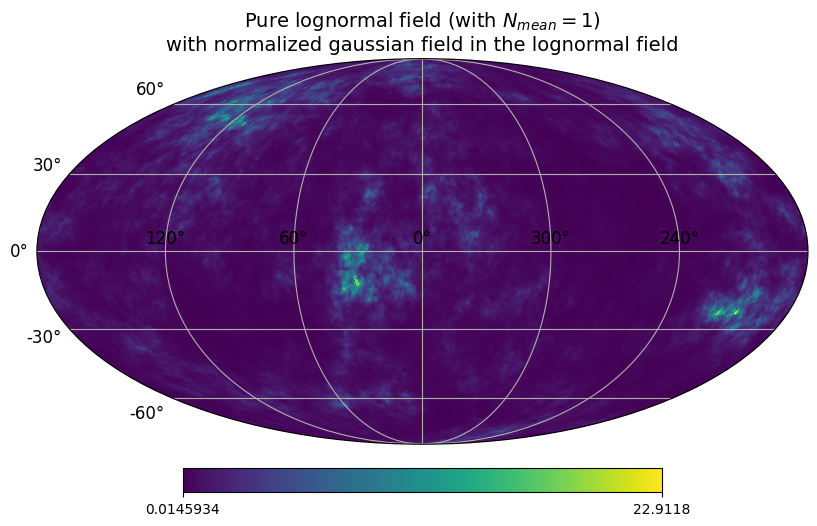

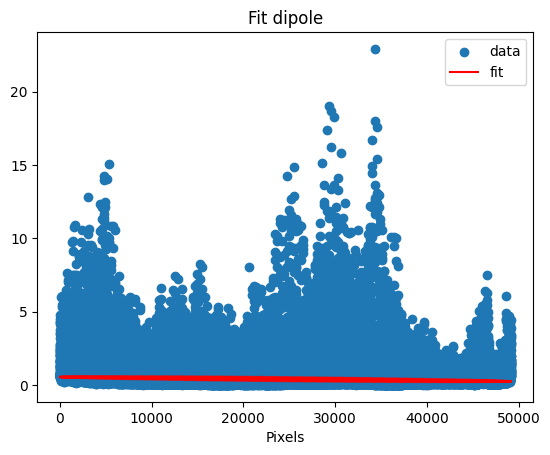

In [11]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, 1, normalize_gauss = True)
title="Nb. of sources from power spectrum"
title = "Pure lognormal field (with $N_{mean} = 1$)\nwith normalized gaussian field in the lognormal field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

#### Gaussian field:

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 88.36 (χ²/ndof = 0.0)      │             Nfcn = 1014              │
│ EDM = 1.26e-06 (Goal: 0.0002)    │            time = 9.2 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │     0     │  0.33e-3  │  -0.33e-3  │  0.12e-3   │    0    │         │       │
│ 1 │ A    │  0.05e-9  │66150.67e-9│  -0.05e-9  │66150.67e-9 │    0    │         │       │
│ 2 │ l    │  0.09e3   │  0.19e3   │  -0.19e3   │   0.19e3   │    0    │   360   │       │
│ 3 │ b    │    56     │    162    │    -162    │     34     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │ -0.33e-3  │  0.12e-3  │ -0.05e-9  │66150.67e-9│  -0.19e3  │  0.19e3   │   -162    │    34     │
│  Valid   │   False   │   True    │   True    │   False   │   False   │   False   │   False   │   True    │
│ At Limit │   False   │   False   │   True    │   False   │   False   │   False   │   False   │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   True    │   False   │   False   │   True    │   True    │   True    │   True    │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────────┐
│   │            M            A            l            b │
├───┼─────────────────────────────────────────────────────┤
│ M │     2.01e-09   -0.008e-12     -48.9e-9     -36.1e-9 │
│ A │   -0.008e-12     1.27e-14 68.010335e-9 46.232408e-9 │
│ l │     -48.9e-9 68.010335e-9     9.82e+04            0 │
│ b │     -36.1e-9 46.232408e-9            0        2e+04 │
└───┴─────────────────────────────────────────────────────┘

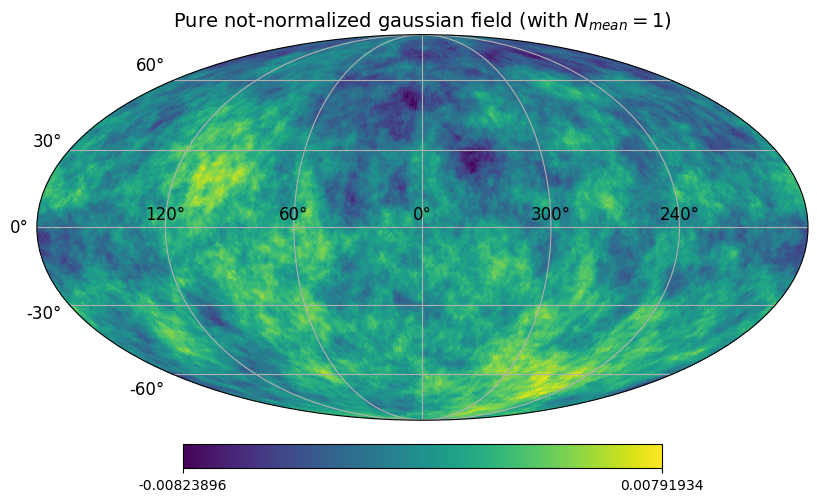

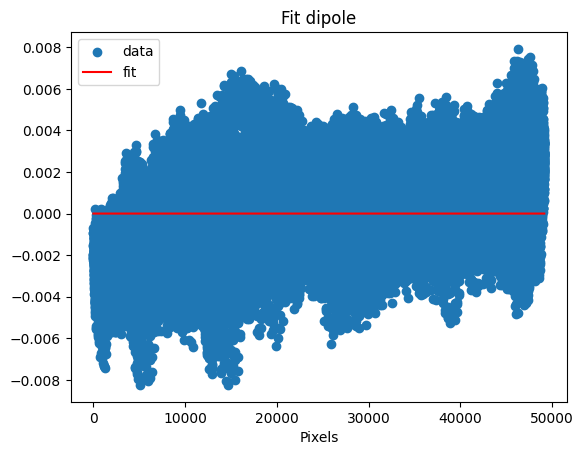

In [12]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, 1, normalize_gauss = False, lognormal=False)
title="Nb. of sources from power spectrum"
title = "Pure not-normalized gaussian field (with $N_{mean} = 1$)"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.973e+04 (χ²/ndof = 0.8)  │              Nfcn = 624              │
│ EDM = 6.67e-05 (Goal: 0.0002)    │            time = 5.9 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │  0.0036   │  0.0015   │  -0.0015   │   0.0015   │    0    │         │       │
│ 1 │ A    │   8e-9    │ 494564e-9 │   -8e-9    │ 494564e-9  │    0    │         │       │
│ 2 │ l    │  0.12e3   │  0.21e3   │  -0.22e3   │   0.22e3   │    0    │   360   │       │
│ 3 │ b    │    79     │    166    │    -166    │     11     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.0015  │  0.0015   │   -8e-9   │ 494564e-9 │  -0.21e3  │  0.22e3   │   -166    │    11     │
│  Valid   │   False   │   False   │   True    │   False   │   False   │   False   │   False   │   True    │
│ At Limit │   False   │   False   │   True    │   False   │   False   │   False   │   False   │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   True    │   True    │   False   │   True    │   True    │   True    │   True    │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────────────┐
│   │             M             A             l             b │
├───┼─────────────────────────────────────────────────────────┤
│ M │      2.39e-06      0.005e-9      -13.7e-6       -1.9e-6 │
│ A │      0.005e-9      1.68e-11 -47.665575e-6  -6.670705e-6 │
│ l │      -13.7e-6 -47.665575e-6      1.16e+05           0e3 │
│ b │       -1.9e-6  -6.670705e-6           0e3      7.23e+03 │
└───┴─────────────────────────────────────────────────────────┘

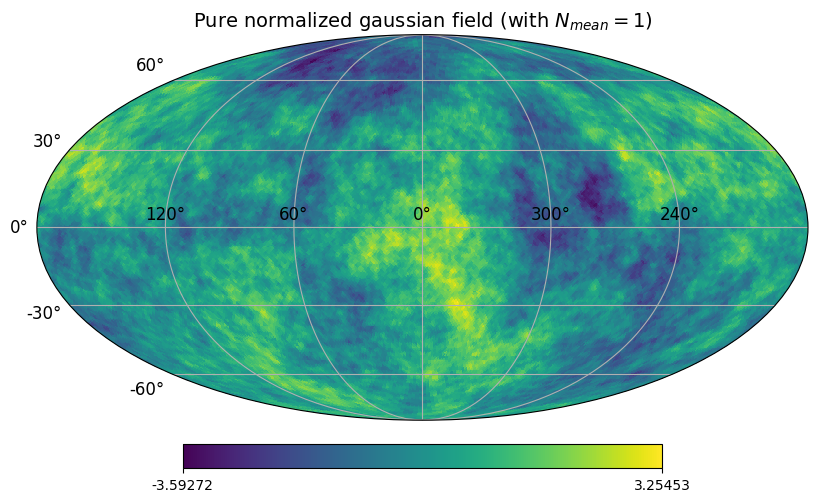

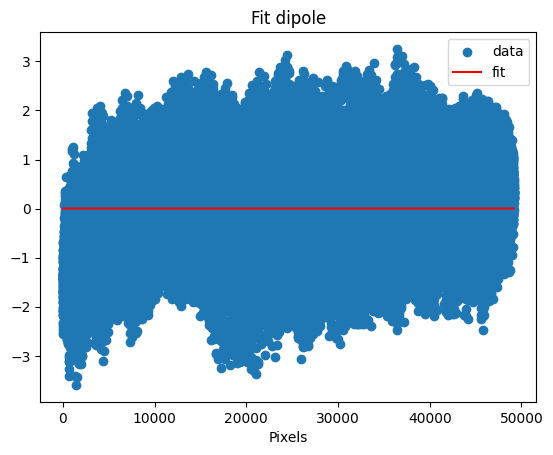

In [13]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, 1, normalize_gauss = True, lognormal=False)
title="Nb. of sources from power spectrum"
title = "Pure normalized gaussian field (with $N_{mean} = 1$)"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

### 2) Field with monopole  $N_{mean} = 10^9$

#### Lognormal field:

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.847e+05 (χ²/ndof = 3.8)  │              Nfcn = 238              │
│ EDM = 2.16e-05 (Goal: 0.0002)    │            time = 2.3 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 999.996e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  1.240e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │   271.5   │    0.5    │    -0.5    │    0.5     │    0    │   360   │       │
│ 3 │ b    │   -39.9   │    0.4    │    -0.4    │    0.4     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │   -0.5    │    0.5    │   -0.4    │    0.4    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────┐
│   │     M     A     l     b │
├───┼─────────────────────────┤
│ M │  20.3     0 -0.00 -0.00 │
│ A │     0  61.1 -0.00 -0.00 │
│ l │ -0.00 -0.00 0.221 -0.00 │
│ b │ -0.00 -0.00 -0.00  0.13 │
└───┴─────────────────────────┘

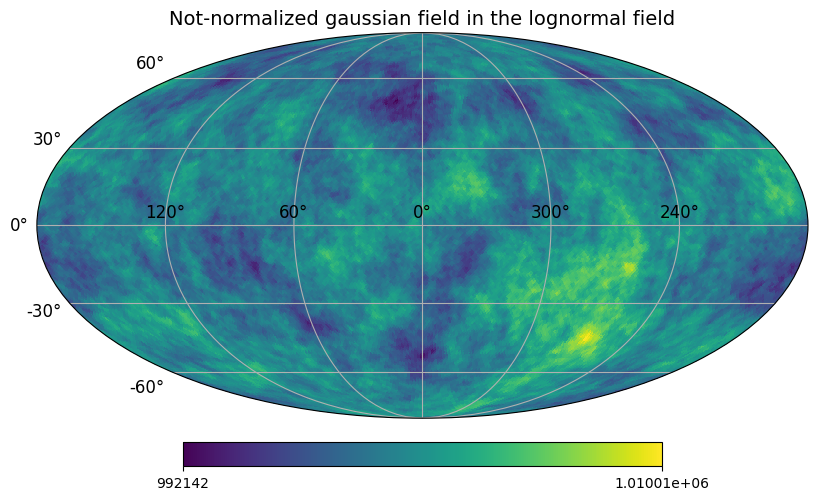

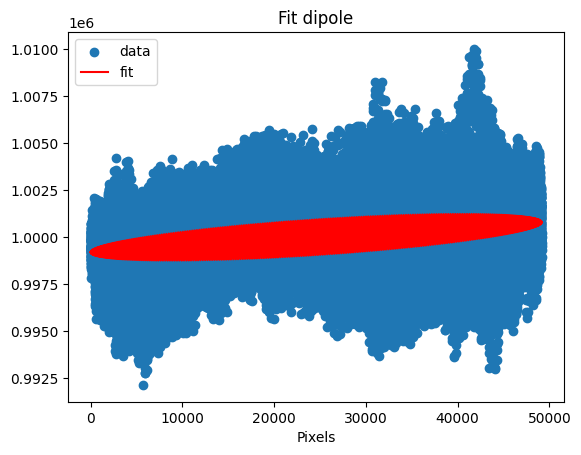

In [14]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, normalize_gauss = False)
title="Nb. of sources from power spectrum"
title = "Not-normalized gaussian field in the lognormal field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 2.706e+10 (χ²/ndof = 550665.3)│              Nfcn = 329              │
│ EDM = 4.1e-05 (Goal: 0.0002)     │            time = 2.9 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 448.722e3 │  0.003e3  │  -0.003e3  │  0.003e3   │    0    │         │       │
│ 1 │ A    │ 359.741e3 │  0.006e3  │  -0.006e3  │  0.006e3   │    0    │         │       │
│ 2 │ l    │ 135.2206  │  0.0007   │  -0.0007   │   0.0007   │    0    │   360   │       │
│ 3 │ b    │  -6.8973  │  0.0007   │  -0.0007   │   0.0008   │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -3     │     3     │    -6     │     6     │  -0.7e-3  │  0.7e-3   │  -0.7e-3  │  0.8e-3   │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────┐
│   │        M        A        l        b │
├───┼─────────────────────────────────────┤
│ M │     9.13        7  -1.1e-6  -1.2e-6 │
│ A │        7     37.2  87.9e-6 365.1e-6 │
│ l │  -1.1e-6  87.9e-6 4.94e-07       -0 │
│ b │  -1.2e-6 365.1e-6       -0 5.61e-07 │
└───┴─────────────────────────────────────┘

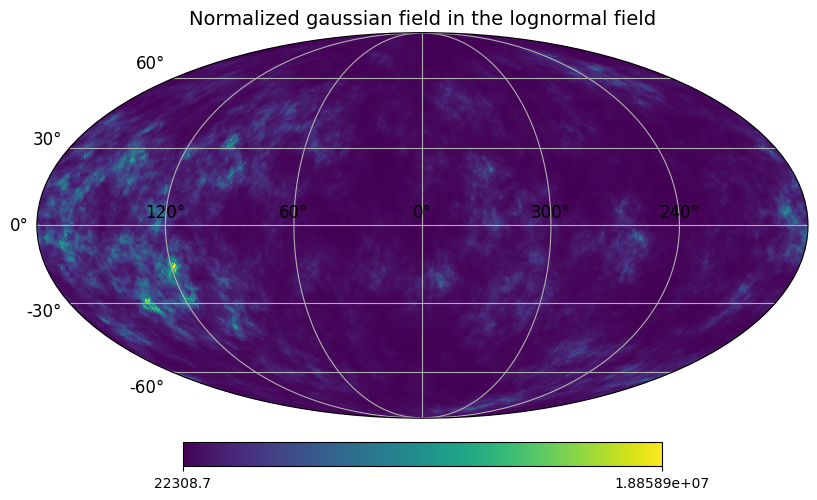

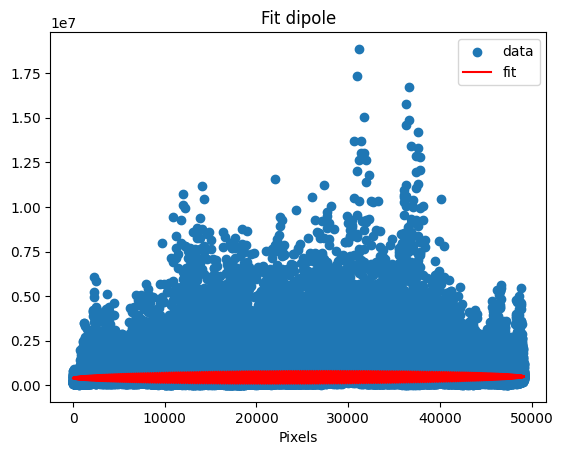

In [15]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, normalize_gauss = True)
title="Nb. of sources from power spectrum"
title = "Normalized gaussian field in the lognormal field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

#### Gaussian field:

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 9.663e+07 (χ²/ndof = 1966.0)│              Nfcn = 313              │
│ EDM = 8.04e-07 (Goal: 0.0002)    │            time = 2.5 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │  1.3e-12  │267607687.5e-12│  -1.3e-12  │267242935.1e-12│    0    │         │       │
│ 1 │ A    │  332.12   │   0.18    │   -0.18    │    0.18    │    0    │         │       │
│ 2 │ l    │  253.991  │   0.025   │   -0.025   │   0.025    │    0    │   360   │       │
│ 3 │ b    │  -14.034  │   0.024   │   -0.024   │   0.024    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │ -1.3e-12  │267242935.1e-12│   -0.18   │   0.18    │  -0.025   │   0.025   │  -0.024   │   0.024   │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   True    │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────┐
│   │           M           A           l           b │
├───┼─────────────────────────────────────────────────┤
│ M │    1.41e-15 10.8646e-12  -944.9e-15   337.0e-15 │
│ A │ 10.8646e-12      0.0311          -0     -0.2e-3 │
│ l │  -944.9e-15          -0    0.000629     -0.1e-3 │
│ b │   337.0e-15     -0.2e-3     -0.1e-3    0.000592 │
└───┴─────────────────────────────────────────────────┘

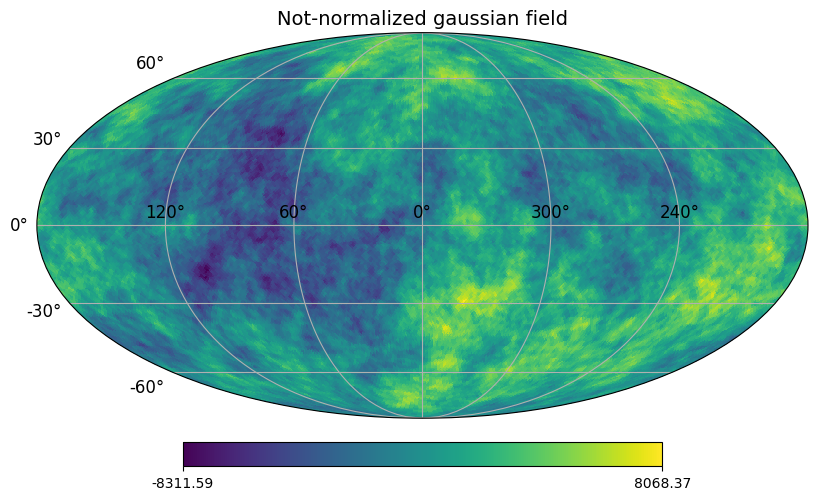

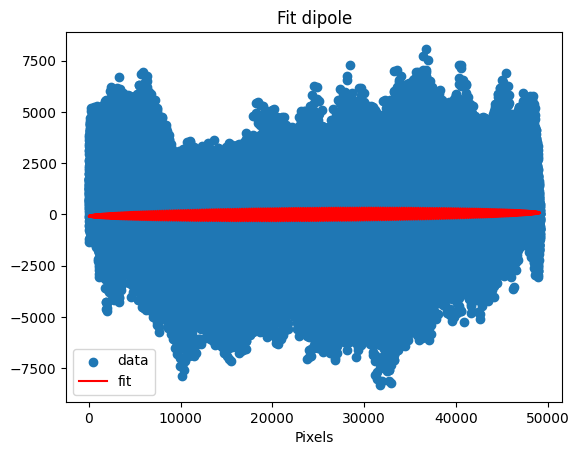

In [16]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, normalize_gauss = False, lognormal=False)
title="Nb. of sources from power spectrum"
title = "Not-normalized gaussian field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

/tmp/ipykernel_1006/3820708360.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


Unable to use minos()


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 3.733e+10 (χ²/ndof = 759618.4)│              Nfcn = 224              │
│ EDM = 0.00672 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   ABOVE EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 18.4354e3 │ 0.0014e3  │            │            │    0    │         │       │
│ 1 │ A    │118.3937e3 │ 0.0028e3  │            │            │    0    │         │       │
│ 2 │ l    │  93.1538  │  0.0023   │            │            │    0    │   360   │       │
│ 3 │ b    │ -61.9922  │  0.0012   │            │            │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────────────────────────────┐
│   │         M         A         l         b │
├───┼─────────────────────────────────────────┤
│ M │      2.11       0.7    906e-6  -78.6e-6 │
│ A │       0.7      7.91 -1.611e-3  274.9e-6 │
│ l │    906e-6 -1.611e-3  5.55e-06   -0.5e-6 │
│ b │  -78.6e-6  274.9e-6   -0.5e-6  1.44e-06 │
└───┴─────────────────────────────────────────┘

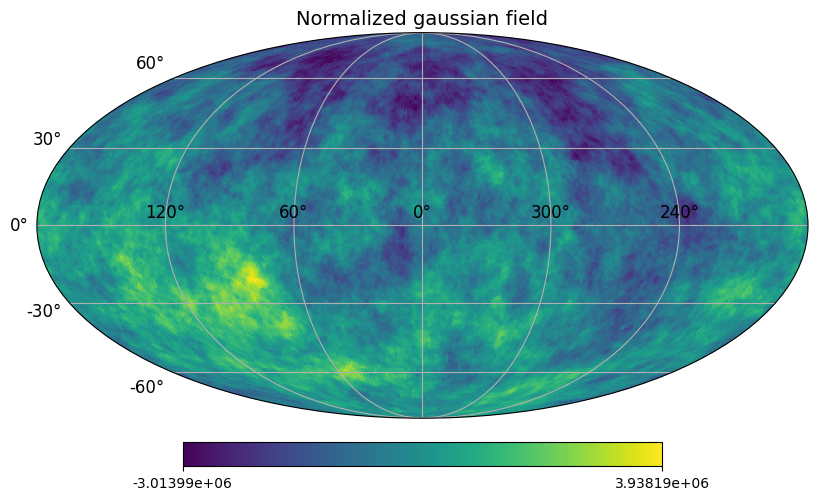

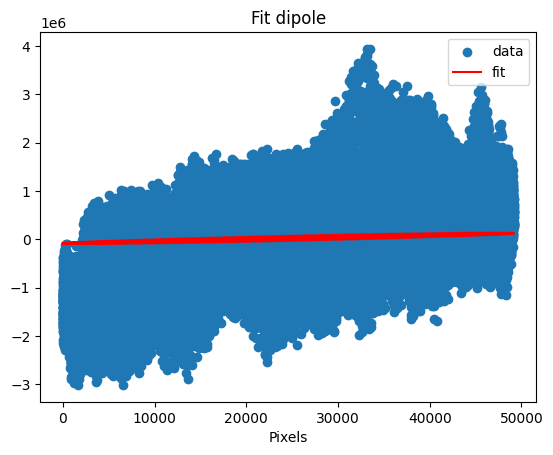

In [17]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, normalize_gauss = True, lognormal=False)
title="Nb. of sources from power spectrum"
title = "Normalized gaussian field"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)
output_path = "Simul_Figures/Simul_Cluster/Cluster_"
#get_savefig(plt, output_path, "NoVar")

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

## Including dipole

/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.75e+08 (χ²/ndof = 3560.8)│              Nfcn = 265              │
│ EDM = 3.75e-06 (Goal: 0.0002)    │            time = 2.3 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 996.388e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  4.026e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │359.999999999994│0.000852506352│-0.000853464297│0.000000000006│    0    │   360   │       │
│ 3 │ b    │  -11.36   │   0.11    │   -0.11    │    0.11    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │-853464297e-12│   6e-12   │   -0.11   │   0.11    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   True    │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────┐
│   │           M           A           l           b │
├───┼─────────────────────────────────────────────────┤
│ M │        20.3           0  18.088e-12      -0.000 │
│ A │           0        60.8 6.708354e-9      -0.006 │
│ l │  18.088e-12 6.708354e-9     1.9e-14  18.091e-12 │
│ b │      -0.000      -0.006  18.091e-12      0.0123 │
└───┴─────────────────────────────────────────────────┘

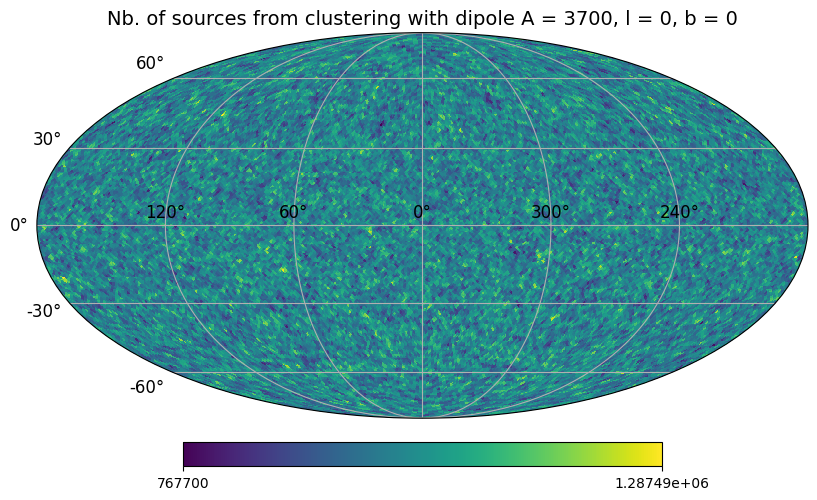

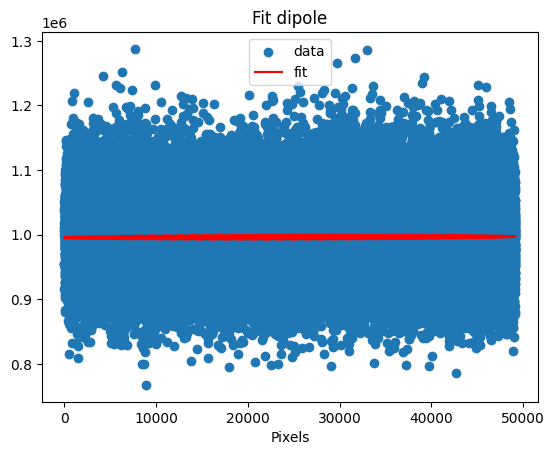

In [15]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, args=(0.25, 0.05, 0.67, 0.8, 0.96, np.linspace(0.01, 1.0, 200)), Cl_model=get_Cl_ccl)
nest = False
A, l, b = 3700, 0, 0
NSource_px_dipole = apply_dipole_MD(NSource_px_Cl, NSource_px_Cl, A, l, b, nest)
hp.projview(NSource_px_dipole, title=f"Nb. of sources from clustering with dipole A = {A}, l = {l}, b = {b}", graticule=True, graticule_labels=True);

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='galactic')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_dipole, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

Cl[ℓ=1] = 6.924730511332348e-07


/tmp/ipykernel_16423/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.091e+08 (χ²/ndof = 2220.4)│              Nfcn = 504              │
│ EDM = 1.53e-06 (Goal: 0.0002)    │            time = 4.7 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 997.910e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  4.416e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │  356.49   │   0.10    │   -0.10    │    0.10    │    0    │   360   │       │
│ 3 │ b    │   -9.2    │    0.1    │    -0.1    │    0.1     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │   -0.1    │    0.1    │   -0.1    │    0.1    │
│  Valid   │   True    │   True    │   False   │   False   │   True    │   True    │   False   │   False   │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────┐
│   │      M      A      l      b │
├───┼─────────────────────────────┤
│ M │   20.3      0 -0.000 -0.000 │
│ A │      0   60.9 -0.003 -0.004 │
│ l │ -0.000 -0.003 0.0105 -0.000 │
│ b │ -0.000 -0.004 -0.000 0.0103 │
└───┴─────────────────────────────┘

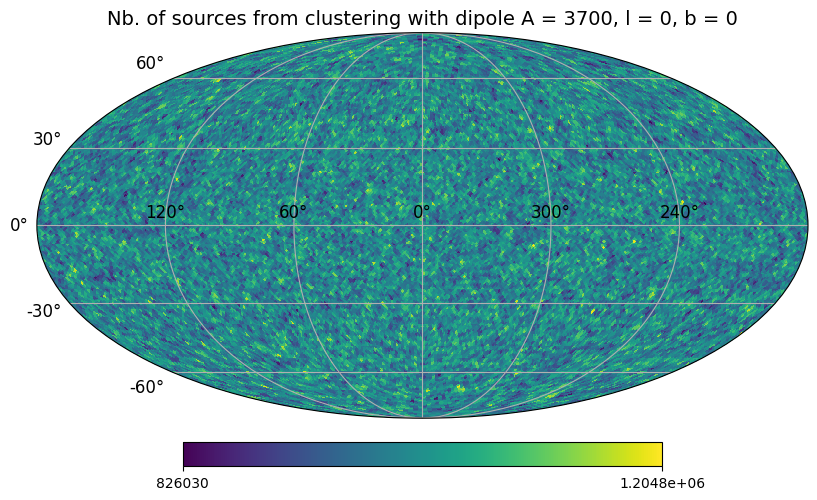

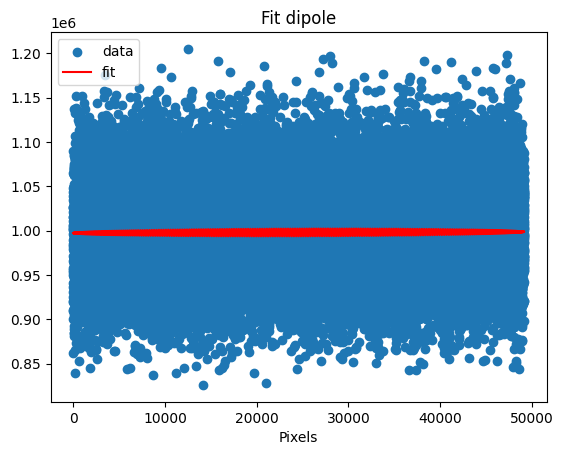

In [18]:
def compute_cl_v2(lmax, zmin):
    #lmax = 3*nside
    ell = np.arange(1, lmax+1)

    z, nz = build_nz(zmin)

    bias = np.ones_like(z)  # b=1

    tracer = ccl.NumberCountsTracer(
        cosmo,
        has_rsd=False,
        dndz=(z, nz),
        bias=(z, bias)
    )

    cl = ccl.angular_cl(cosmo, tracer, tracer, ell)
    print("Cl[ℓ=1] =", cl[0])
    return ell, cl

NSource_px_Cl = generate_healpix_count_map(NSIDE, NSource_px_th, args=(0,), Cl_model=compute_cl_v2)
nest = False
A, l, b = 3700, 0, 0
NSource_px_dipole = apply_dipole_MD(NSource_px_Cl, NSource_px_Cl, A, l, b, nest)
hp.projview(NSource_px_dipole, title=f"Nb. of sources from clustering with dipole A = {A}, l = {l}, b = {b}", graticule=True, graticule_labels=True);

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='galactic')
init =  (1000, 3000, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_dipole, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

Cl[ℓ=1] = 6.924730511332348e-07


/tmp/ipykernel_1051/819217404.py:24: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  delta_spherical = hp.synfast(Cl, nside, lmax=lmax, verbose=False) #synfast combines random phase generation and inverse transform


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 108.7 (χ²/ndof = 0.0)      │              Nfcn = 468              │
│ EDM = 1.02e-05 (Goal: 0.0002)    │            time = 7.0 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │   0.998   │   0.005   │   -0.004   │   0.005    │    0    │         │       │
│ 1 │ A    │  0.0016   │  0.0095   │  -0.0016   │   0.0078   │    0    │         │       │
│ 2 │ l    │  359.992  │  293.145  │  -359.992  │   0.008    │    0    │   360   │       │
│ 3 │ b    │    -10    │    100    │    -80     │    100     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │  -0.004   │   0.005   │  -0.0016  │  0.0078   │ -359.992  │   0.008   │    -80    │    100    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   True    │   False   │   True    │   True    │   True    │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────┐
│   │         M         A         l         b │
├───┼─────────────────────────────────────────┤
│ M │  2.03e-05         0  0.001e-3 -0.021e-3 │
│ A │         0  6.09e-05   0.83e-3 -19.30e-3 │
│ l │  0.001e-3   0.83e-3       179         0 │
│ b │ -0.021e-3 -19.30e-3         0  7.86e+04 │
└───┴─────────────────────────────────────────┘

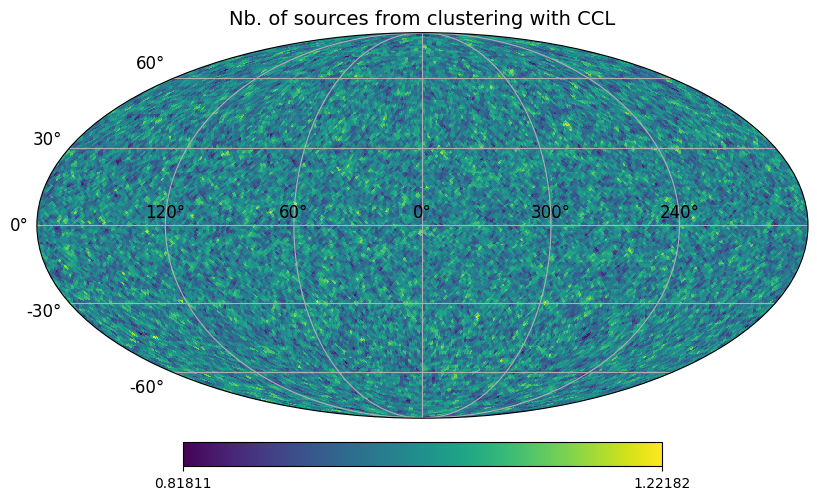

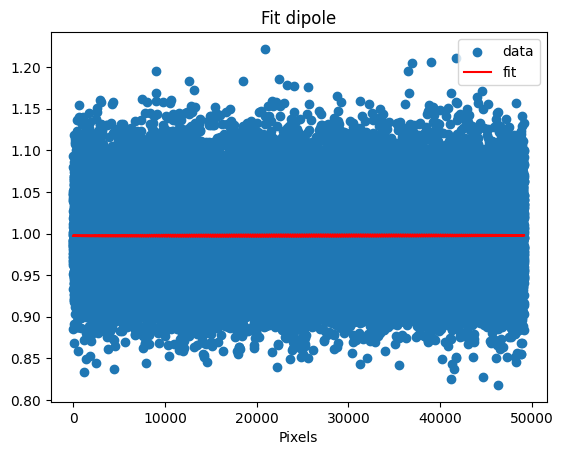

In [29]:
NSource_px_Cl = generate_healpix_count_map(NSIDE, 1, args=(0,), Cl_model=compute_cl_v2)
hp.projview(NSource_px_Cl, title="Nb. of sources from clustering with CCL", graticule=True, graticule_labels=True);

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 200, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

Cl[ℓ=1] = 6.924730511332348e-07


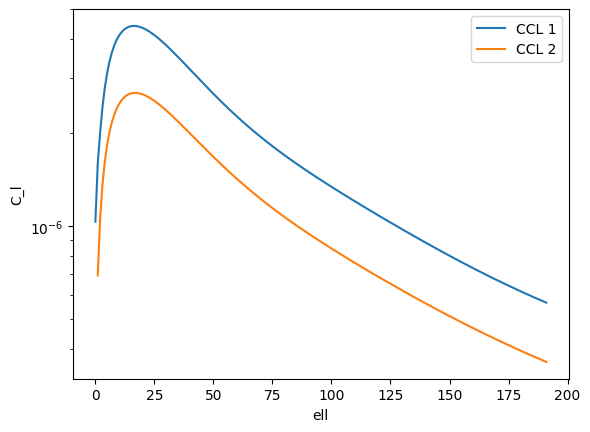

In [25]:
lmax = 3*NSIDE - 1
ell_ccl1, Cl_ccl1 = get_Cl_ccl(lmax, 0.25, 0.05, 0.67, 0.8, 0.96, np.linspace(0.01, 1.0, 200))
ell_ccl2, Cl_ccl2 = compute_cl_v2(lmax, 0)

fig, ax = plt.subplots()
ax.plot(ell_ccl1, Cl_ccl1, label='CCL 1')
ax.plot(ell_ccl2, Cl_ccl2, label='CCL 2')
ax.set_xlabel('ell')
ax.set_ylabel('C_l')
ax.set_yscale('log')
ax.legend();

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.739e+08 (χ²/ndof = 3537.4)│              Nfcn = 446              │
│ EDM = 0.00187 (Goal: 0.0002)     │            time = 6.4 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 997.302e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  3.316e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │   12.29   │   0.14    │   -0.13    │    0.14    │    0    │   360   │       │
│ 3 │ b    │   -5.67   │   0.14    │   -0.13    │    0.13    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │   -0.13   │   0.14    │   -0.14   │   0.13    │
│  Valid   │   False   │   False   │   False   │   False   │   True    │   True    │   False   │   False   │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────┐
│   │      M      A      l      b │
├───┼─────────────────────────────┤
│ M │   20.3      0 -0.000 -0.000 │
│ A │      0   60.8 -0.001 -0.001 │
│ l │ -0.000 -0.001 0.0184 -0.000 │
│ b │ -0.000 -0.001 -0.000 0.0182 │
└───┴─────────────────────────────┘

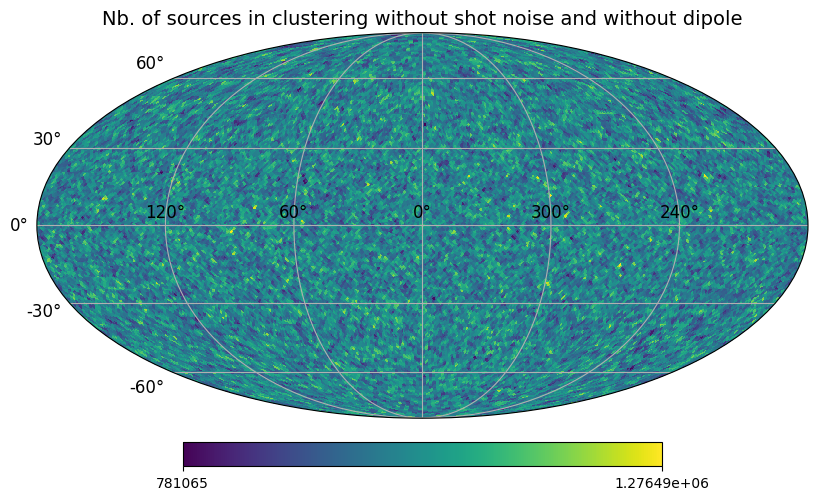

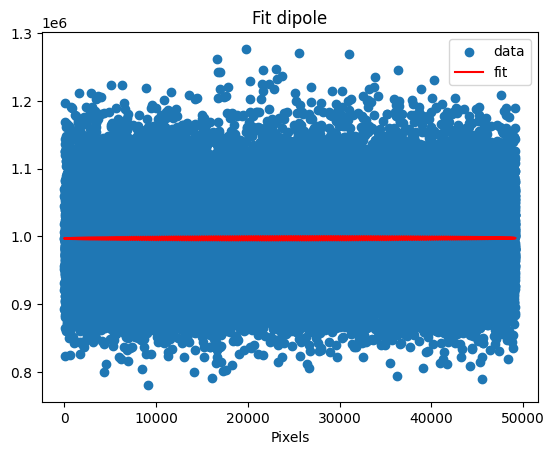

In [39]:
nside = NSIDE
NSource_px_Cl = simulate_map(Cl_ccl1, nside, use_clustering=True, lognormal=True) * NSource_px_th
NSource_px_dipole = apply_dipole_MD(NSource_px_Cl, NSource_px_Cl, A, l, b, nest)

title="Nb. of sources in clustering without shot noise and without dipole"
hp.projview(NSource_px_dipole, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_dipole, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

## Code chatGPT

Cl[ℓ=1] = 6.924730511332348e-07

=== RESULTS ===
zmin: 0.0
Clustering: False
Noise: poisson
True dipole: [0, 0, 0.01]
Mean: [-7.49319645e-07  1.53470208e-06  5.73832661e-08]
Std : [1.20127673e-05 1.25024494e-05 8.33071299e-06]
Amplitude: 1.7188652246760707e-05


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 4.907e+04 (χ²/ndof = 1.0)  │              Nfcn = 663              │
│ EDM = 5.75e-06 (Goal: 0.0002)    │            time = 6.3 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │1.000010e6 │0.000005e6 │-0.000005e6 │ 0.000005e6 │    0    │         │       │
│ 1 │ A    │     6     │     7     │     -6     │     8      │    0    │         │       │
│ 2 │ l    │    150    │    70     │    -150    │    210     │    0    │   360   │       │
│ 3 │ b    │    -10    │    60     │    -80     │    100     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -6     │     8     │  -0.15e3  │  0.21e3   │    -80    │    100    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   True    │   False   │   True    │   True    │   True    │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────┐
│   │        M        A        l        b │
├───┼─────────────────────────────────────┤
│ M │     20.3        0       -0        0 │
│ A │        0       61       -0        0 │
│ l │       -0       -0 5.43e+03     -0e3 │
│ b │        0        0     -0e3 5.12e+03 │
└───┴─────────────────────────────────────┘

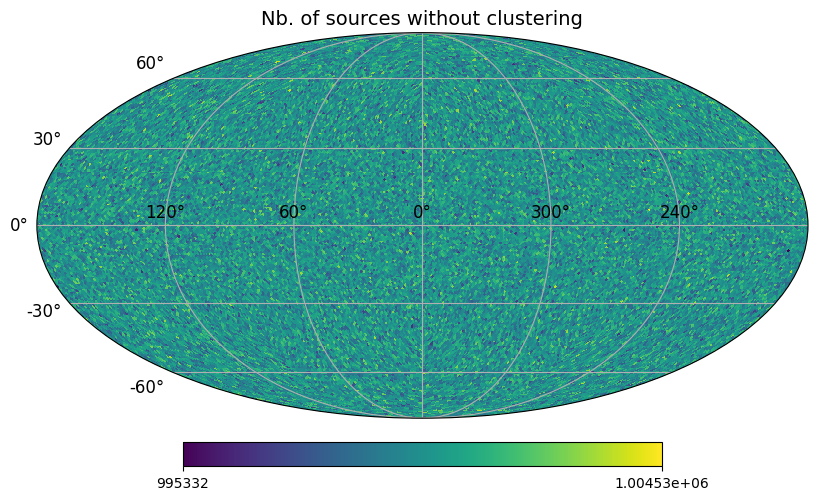

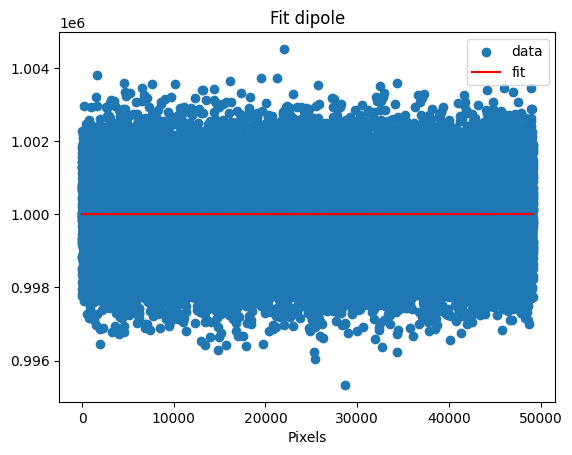

In [17]:
# =========================
# 1. Cosmologie
# =========================
cosmo = ccl.CosmologyVanillaLCDM()
Omega_c, Omega_b, h,sigma8, n_s, = 0.25, 0.05, 0.67, 0.8, 0.96
cosmo = ccl.Cosmology(#transfer_function='boltzmann_class',
    Omega_c=Omega_c,
    Omega_b=Omega_b,
    h=h,
    sigma8=sigma8,
    n_s=n_s
)

# =========================
# 2. n(z) réaliste
# =========================
def nz_model(z):
    """Compute the normalized distribution in redshift dependong on the redshift z."""
    return z**2 * np.exp(-(z/0.5)**1.5)

def build_nz(zmin):
    z = np.linspace(0.01, 3.0, 400)
    nz = nz_model(z)
    nz[z < zmin] = 0
    nz /= np.trapz(nz, z)
    return z, nz

# =========================
# 3. Cl via CCL
# =========================
def compute_cl(nside, zmin):
    lmax = 3*nside
    ell = np.arange(1, lmax+1)

    z, nz = build_nz(zmin)

    bias = np.ones_like(z)  # b=1

    tracer = ccl.NumberCountsTracer(
        cosmo,
        has_rsd=False,
        dndz=(z, nz),
        bias=(z, bias)
    )

    cl = ccl.angular_cl(cosmo, tracer, tracer, ell)
    print("Cl[ℓ=1] =", cl[0])
    return cl

# =========================
# 4. Simulation carte
# =========================
def simulate_map(cl, nside, use_clustering=True, lognormal=False):
    if use_clustering:
        m = hp.synfast(cl, nside=nside)
        if lognormal: m = np.exp(m - 0.5 * np.var(m)) #Log-Normale transformation
    else:
        m = np.zeros(hp.nside2npix(nside))
    return m

# =========================
# 5. Injection dipôle
# =========================
def inject_dipole(map_, nside, dipole_amp):
    npix = hp.nside2npix(nside)
    theta, phi = hp.pix2ang(nside, np.arange(npix))

    n_hat = np.vstack([
        np.sin(theta)*np.cos(phi),
        np.sin(theta)*np.sin(phi),
        np.cos(theta)
    ]).T

    l, b = 0, 0
    l, b = np.radians(l), np.radians(b)
    d = dipole_amp*np.array([np.sin(b)*np.cos(l),
        np.sin(b)*np.sin(l),
        np.cos(b)])
    dipole = n_hat @ d

    return map_ + dipole

# =========================
# 6. Comptage (Poisson / NegBin)
# =========================
def shotNoise_negBin(mu, alpha):
    var = mu + alpha * mu**2
    p = mu / var
    r = mu**2 / (var - mu)
    return np.random.negative_binomial(r, 1-p)

def sample_counts(delta, Nbar, mode="poisson", alpha=1.0, lognormal=False):
    if lognormal: mu = Nbar * delta
    else: mu = Nbar * (1 + delta)

    if mode == "poisson":
        return np.random.poisson(mu)

    elif mode == "negbin":
        return shotNoise_negBin(mu, alpha)
    
    else: return mu

# =========================
# 7. Estimateur MLE
# =========================
def estimate_dipole_mle(counts, mask, nside):
    npix = len(counts)
    theta, phi = hp.pix2ang(nside, np.arange(npix))

    n_hat = np.vstack([
        np.sin(theta)*np.cos(phi),
        np.sin(theta)*np.sin(phi),
        np.cos(theta)
    ]).T

    w = mask
    y = counts / np.mean(counts) - 1

    A = (n_hat.T * w) @ n_hat
    b = (n_hat.T * w) @ y

    d = np.linalg.solve(A, b)

    return d

# =========================
# 8. Masque simple (sud + plan galactique)
# =========================
def build_mask(nside):
    npix = hp.nside2npix(nside)
    theta, phi = hp.pix2ang(nside, np.arange(npix))

    # hémisphère sud
    mask = (theta > np.pi/2).astype(float)

    # retirer plan galactique |b| < 5°
    b = np.pi/2 - theta
    mask[np.abs(b) < np.deg2rad(5)] = 0.

    return mask

# =========================
# 9. Monte Carlo
# =========================
def run_monte_carlo(Nbar=1e4,
    nsim=50,
    nside=64,
    dipole_amp=0.01,
    zmin=0.0,
    use_clustering=True,
    noise_model="poisson", lognormal=False
):

    cl = compute_cl(nside, zmin)
    mask = build_mask(nside)

    results = []

    for _ in range(nsim):

        m = simulate_map(cl, nside, use_clustering, lognormal=lognormal)

        #m = inject_dipole(m, nside, dipole_amp)
        #m = apply_dipole_MD(m, m, dipole_amp, 0, 0, nest=False)

        counts = sample_counts(m, Nbar=Nbar, mode=noise_model, lognormal=lognormal)
        counts = apply_dipole_MD(counts, counts, dipole_amp, 0, 0, nest=False)

        d = estimate_dipole_mle(counts, mask, nside)

        results.append(d)

    results = np.array(results)

    print("\n=== RESULTS ===")
    print("zmin:", zmin)
    print("Clustering:", use_clustering)
    print("Noise:", noise_model)
    print("True dipole:", [0,0,dipole_amp])

    print("Mean:", np.mean(results, axis=0))
    print("Std :", np.std(results, axis=0))
    print("Amplitude:", np.mean(np.linalg.norm(results, axis=1)))

    return results, m, counts

# sans clustering
_, _, NSource_px_Cl = run_monte_carlo(zmin=0.0, use_clustering=False, lognormal=False, Nbar=NSource_px_th)
title="Nb. of sources without clustering"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

### In one step:

Cl[ℓ=1] = 6.924730511332348e-07

=== RESULTS ===
zmin: 0.0
Clustering: True
Noise: poisson
True dipole: [0, 0, 3700]
Mean: [ 3.82242554e-03  7.58566609e-05 -6.45808525e-05]
Std : [0.00086993 0.00092698 0.00059532]
Amplitude: 0.0039832012445006875


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.112e+08 (χ²/ndof = 2261.6)│              Nfcn = 463              │
│ EDM = 2.79e-06 (Goal: 0.0002)    │            time = 4.0 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 997.670e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  2.666e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │  356.09   │   0.17    │   -0.17    │    0.17    │    0    │   360   │       │
│ 3 │ b    │   -0.18   │   0.17    │   -0.17    │    0.17    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │   -0.17   │   0.17    │   -0.17   │   0.17    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────┐
│   │      M      A      l      b │
├───┼─────────────────────────────┤
│ M │   20.3      0  0.000  0.000 │
│ A │      0   60.9 -0.001 -0.000 │
│ l │  0.000 -0.001 0.0281 -0.000 │
│ b │  0.000 -0.000 -0.000 0.0281 │
└───┴─────────────────────────────┘

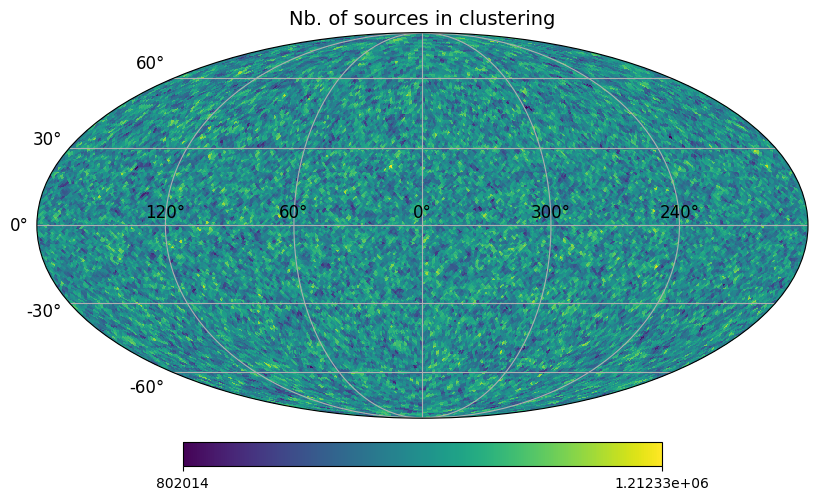

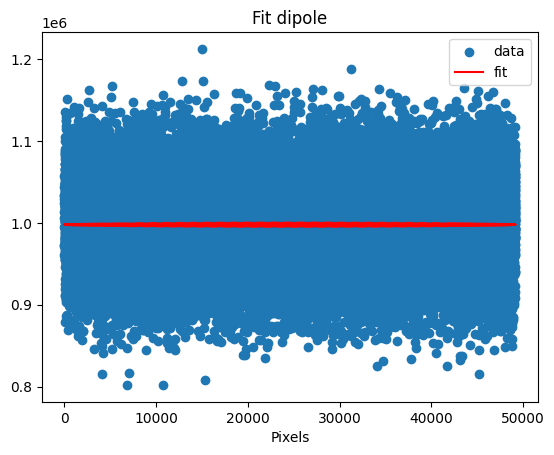

In [19]:
# clustering complet
_, _, NSource_px_Cl = run_monte_carlo(zmin=0.0, use_clustering=True, lognormal=False, Nbar=NSource_px_th, dipole_amp=3700)
title="Nb. of sources in clustering"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

Cl[ℓ=1] = 3.3673532051951066e-07

=== RESULTS ===
zmin: 0.5
Clustering: True
Noise: poisson
True dipole: [0, 0, 0.01]
Mean: [ 3.61212677e-05 -6.78567698e-05 -8.67249299e-05]
Std : [0.00071049 0.00066749 0.00038682]
Amplitude: 0.0009514782091237097


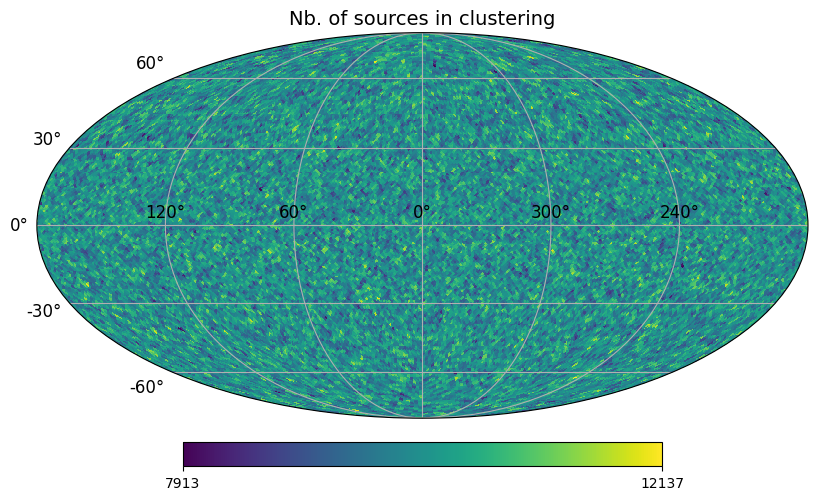

In [20]:
# coupe en redshift
_, _, NSource_px_Cl = run_monte_carlo(zmin=0.5, use_clustering=True)
title="Nb. of sources in clustering"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

Cl[ℓ=1] = 1.5362935326672386e-07

=== RESULTS ===
zmin: 1.0
Clustering: True
Noise: poisson
True dipole: [0, 0, 0.01]
Mean: [ 1.77646469e-04  1.59769468e-04 -2.79463837e-05]
Std : [0.00042686 0.00044464 0.00029103]
Amplitude: 0.0006446631409145871


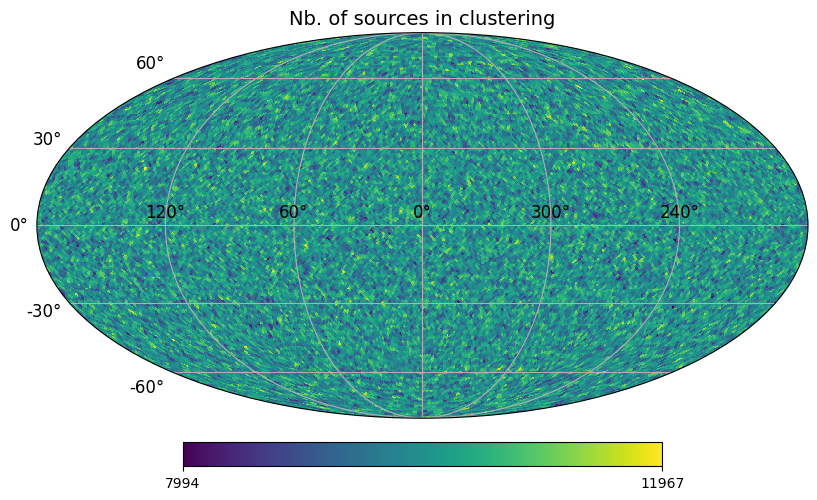

In [21]:
_, _, NSource_px_Cl = run_monte_carlo(zmin=1.0, use_clustering=True)
title="Nb. of sources in clustering"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

Cl[ℓ=1] = 6.342553171759293e-08

=== RESULTS ===
zmin: 2.0
Clustering: True
Noise: poisson
True dipole: [0, 0, 0.01]
Mean: [-2.84324657e-05  6.36410544e-05 -2.29116339e-05]
Std : [0.00030104 0.00026971 0.00018181]
Amplitude: 0.000421841832648352


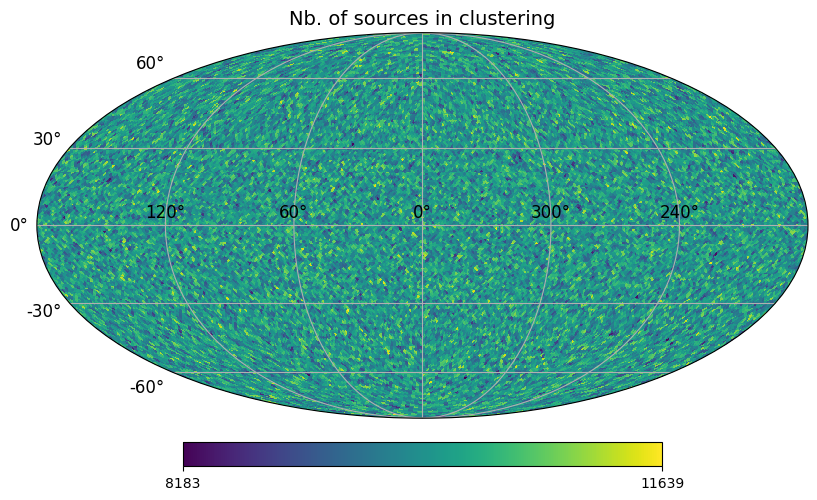

In [22]:
_, _, NSource_px_Cl = run_monte_carlo(zmin=2.0, use_clustering=True)
title="Nb. of sources in clustering"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

### Step by step:

#### Test $N = M(1 + \delta + D)$:

Cl[ℓ=1] = 6.924730511332348e-07


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1862 (χ²/ndof = 0.0)       │             Nfcn = 1023              │
│ EDM = 7.66e-06 (Goal: 0.0002)    │            time = 9.0 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 0.023e-3  │ 1.152e-3  │ -0.023e-3  │  0.328e-3  │    0    │         │       │
│ 1 │ A    │  0.05e-3  │  1.46e-3  │  -0.05e-3  │  0.58e-3   │    0    │         │       │
│ 2 │ l    │  0.16e3   │  0.22e3   │  -0.16e3   │   0.20e3   │    0    │   360   │       │
│ 3 │ b    │    -30    │    120    │    -60     │    120     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │ -0.023e-3 │ 0.328e-3  │ -0.05e-3  │  0.58e-3  │  -0.16e3  │  0.20e3   │    -60    │    120    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   True    │   False   │   True    │   False   │   True    │   True    │   True    │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────────┐
│   │            M            A            l            b │
├───┼─────────────────────────────────────────────────────┤
│ M │     1.08e-07      0.03e-6  34.28029e-3 -13.93412e-3 │
│ A │      0.03e-6     3.12e-07  -8.42907e-3  44.10745e-3 │
│ l │  34.28029e-3  -8.42907e-3     4.72e+05            0 │
│ b │ -13.93412e-3  44.10745e-3            0     3.79e+05 │
└───┴─────────────────────────────────────────────────────┘

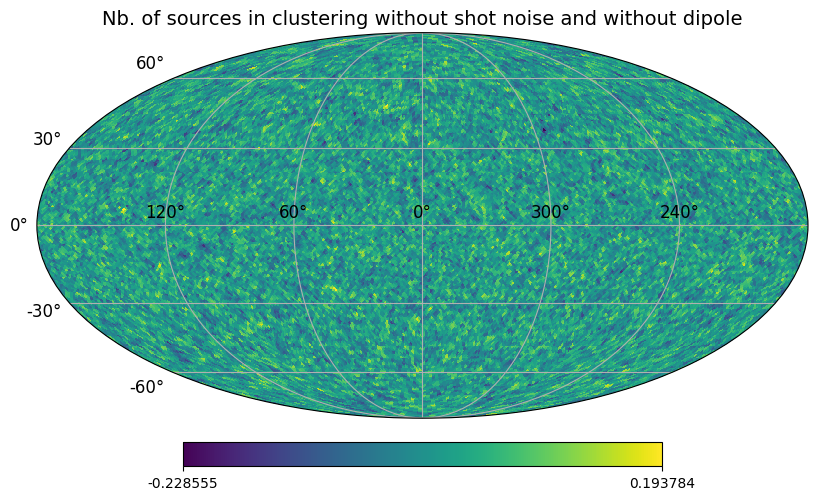

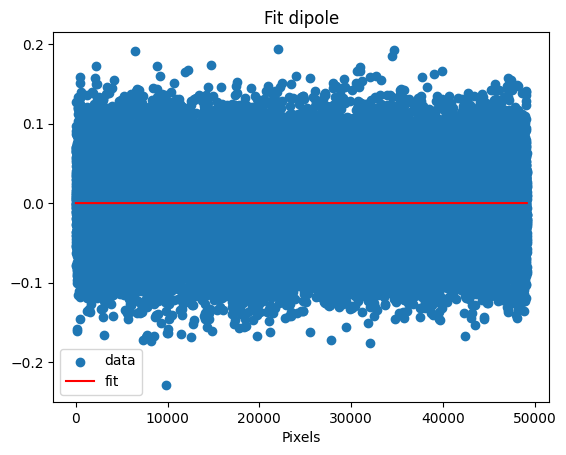

In [26]:
nside = NSIDE
lognormal=False
cl = compute_cl(nside, 0)
NSource_px_Cl = simulate_map(cl, nside, use_clustering=True, lognormal=lognormal)

title="Nb. of sources in clustering without shot noise and without dipole"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1872 (χ²/ndof = 0.0)       │              Nfcn = 994              │
│ EDM = 1.73e-06 (Goal: 0.0002)    │            time = 9.0 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │  0.08e-3  │  0.34e-3  │  -0.08e-3  │  0.32e-3   │    0    │         │       │
│ 1 │ A    │  0.8e-3   │  0.6e-3   │  -0.6e-3   │   0.6e-3   │    0    │         │       │
│ 2 │ l    │   0.12    │  243.03   │   -0.12    │  -310.08   │    0    │   360   │       │
│ 3 │ b    │    -10    │    40     │    -40     │     50     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │ -0.08e-3  │  0.32e-3  │  -0.6e-3  │  0.6e-3   │   -0.12   │  -310.08  │    -40    │    50     │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   True    │   False   │   False   │   False   │   True    │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────┐
│   │           M           A           l           b │
├───┼─────────────────────────────────────────────────┤
│ M │    1.04e-07     0.02e-6   -45.13e-6  2.53472e-3 │
│ A │     0.02e-6    3.29e-07  -737.90e-6 -3.21943e-3 │
│ l │   -45.13e-6  -737.90e-6        75.6         -60 │
│ b │  2.53472e-3 -3.21943e-3         -60    1.48e+03 │
└───┴─────────────────────────────────────────────────┘

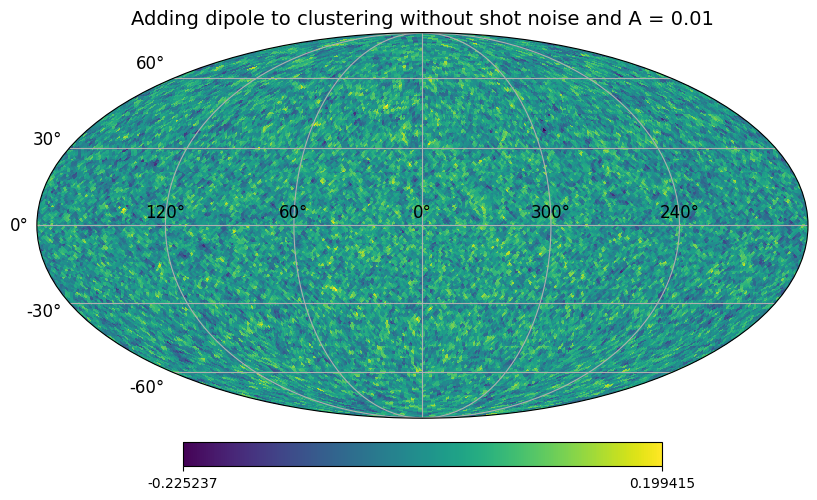

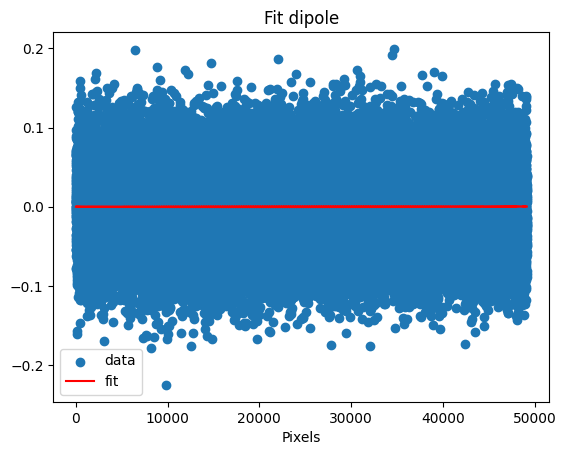

In [27]:
dipole_amp = 0.01
nest = False
#NSource_px_dipole = inject_dipole(NSource_px_Cl, nside, dipole_amp)
NSource_px_dipole = apply_dipole_MD(NSource_px_Cl, NSource_px_Cl, dipole_amp, 0, 0, nest=nest)

title=f"Adding dipole to clustering without shot noise and A = {dipole_amp}"
hp.projview(NSource_px_dipole, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_dipole, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.111e+08 (χ²/ndof = 2259.7)│              Nfcn = 430              │
│ EDM = 2.28e-05 (Goal: 0.0002)    │            time = 3.5 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 997.959e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  9.747e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │   2.59    │   0.05    │   -0.05    │    0.05    │    0    │   360   │       │
│ 3 │ b    │   -0.54   │   0.05    │   -0.05    │    0.05    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │   -0.05   │   0.05    │   -0.05   │   0.05    │
│  Valid   │   False   │   False   │   False   │   False   │   True    │   True    │   False   │   False   │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────┐
│   │       M       A       l       b │
├───┼─────────────────────────────────┤
│ M │    20.3       0 -0.0000 -0.0000 │
│ A │       0    60.9 -0.0001  0.0001 │
│ l │ -0.0000 -0.0001  0.0021  0.0000 │
│ b │ -0.0000  0.0001  0.0000 0.00211 │
└───┴─────────────────────────────────┘

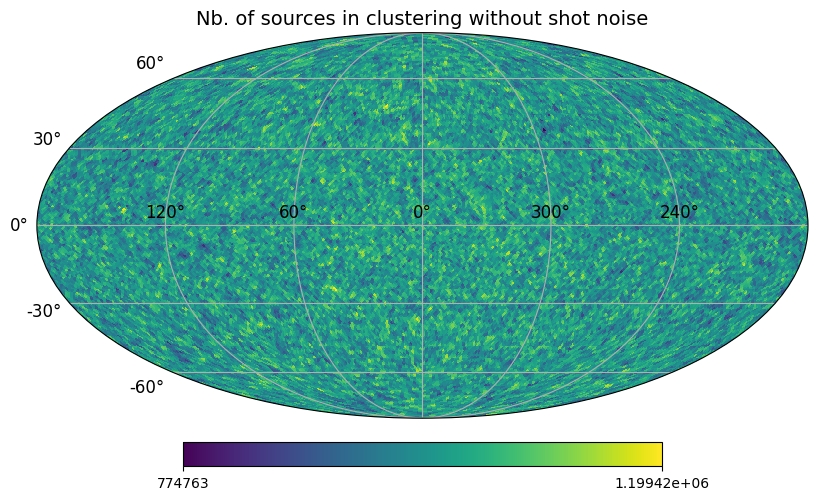

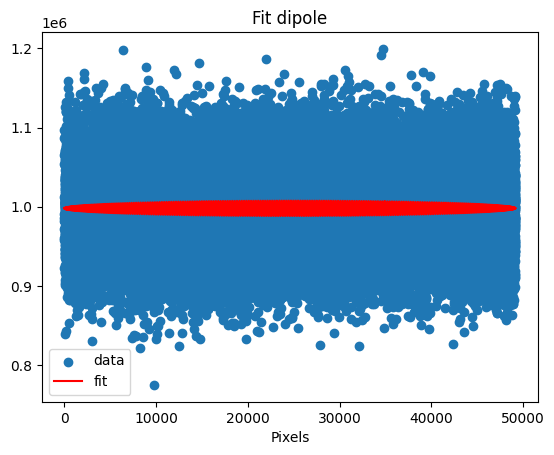

In [28]:
counts = sample_counts(NSource_px_dipole, Nbar=NSource_px_th, mode="", lognormal=lognormal)
title="Nb. of sources in clustering without shot noise"
hp.projview(counts, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, counts, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

#### Test de $N = M(1 + \delta ) + D$:

Cl[ℓ=1] = 6.924730511332348e-07


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1866 (χ²/ndof = 0.0)       │              Nfcn = 825              │
│ EDM = 0.000239 (Goal: 0.0002)    │            time = 7.4 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │  0.05e-3  │  0.48e-3  │  -0.05e-3  │  0.30e-3   │    0    │         │       │
│ 1 │ A    │  0.04e-3  │  1.31e-3  │  -0.04e-3  │  0.52e-3   │    0    │         │       │
│ 2 │ l    │    24     │    250    │    -24     │    336     │    0    │   360   │       │
│ 3 │ b    │    50     │    160    │    -140    │     40     │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │ -0.05e-3  │  0.30e-3  │ -0.04e-3  │  0.52e-3  │    -24    │    336    │   -140    │    40     │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   True    │   False   │   True    │   False   │   True    │   True    │   True    │   True    │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────────────┐
│   │           M           A           l           b │
├───┼─────────────────────────────────────────────────┤
│ M │    8.96e-08     0.05e-6  1.15128e-3 -1.66697e-3 │
│ A │     0.05e-6    2.29e-07 10.41664e-3 -2.31573e-3 │
│ l │  1.15128e-3 10.41664e-3    3.33e+04    -0.001e6 │
│ b │ -1.66697e-3 -2.31573e-3    -0.001e6    2.24e+04 │
└───┴─────────────────────────────────────────────────┘

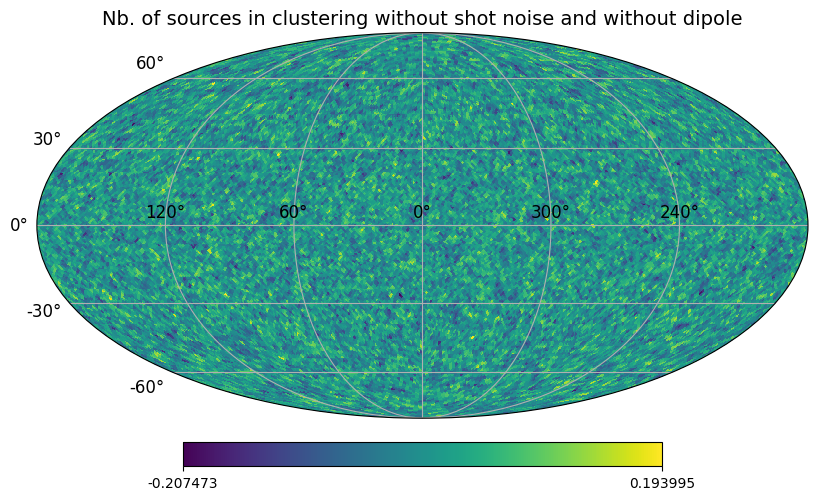

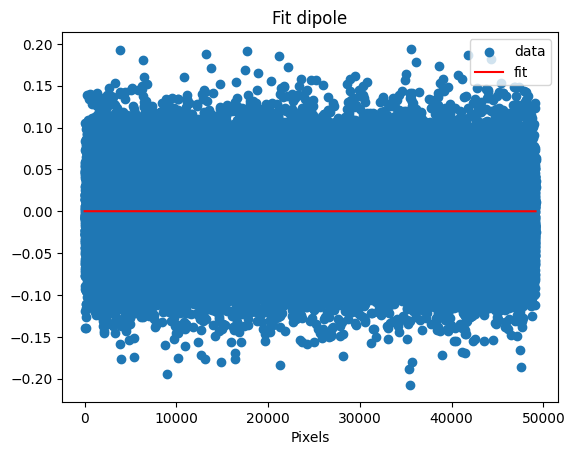

In [26]:
nside = NSIDE
lognormal=False
cl = compute_cl(nside, 0)
NSource_px_Cl = simulate_map(cl, nside, use_clustering=True, lognormal=lognormal)

title="Nb. of sources in clustering without shot noise and without dipole"
hp.projview(NSource_px_Cl, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_Cl, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

Unable to use minos()


┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.117e+08 (χ²/ndof = 2272.0)│              Nfcn = 193              │
│ EDM = 0.00674 (Goal: 0.0002)     │                                      │
├──────────────────────────────────┼──────────────────────────────────────┤
│         INVALID Minimum          │   ABOVE EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│      No parameters at limit      │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 998.267e3 │  0.005e3  │            │            │    0    │         │       │
│ 1 │ A    │    322    │     8     │            │            │    0    │         │       │
│ 2 │ l    │   140.0   │    1.6    │            │            │    0    │   360   │       │
│ 3 │ b    │   -31.0   │    1.4    │            │            │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌───┬─────────────────────┐
│   │    M    A    l    b │
├───┼─────────────────────┤
│ M │ 20.3    0  0.0 -0.0 │
│ A │    0 61.4  0.8 -0.7 │
│ l │  0.0  0.8 2.65  0.1 │
│ b │ -0.0 -0.7  0.1 1.95 │
└───┴─────────────────────┘

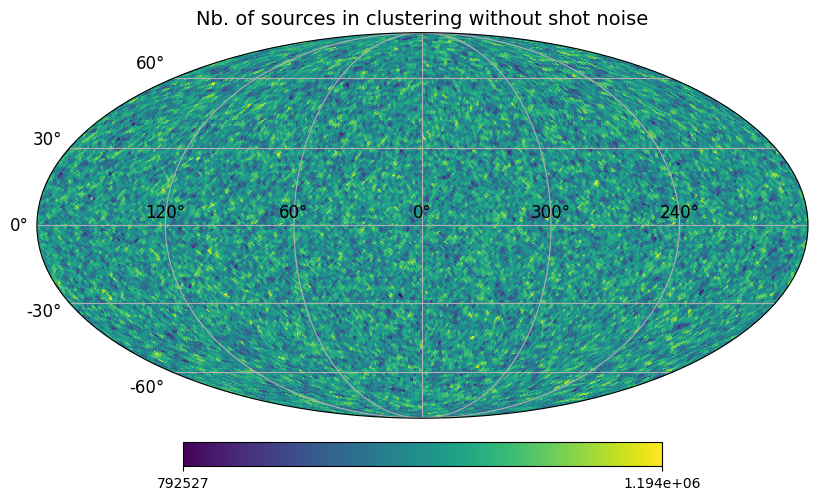

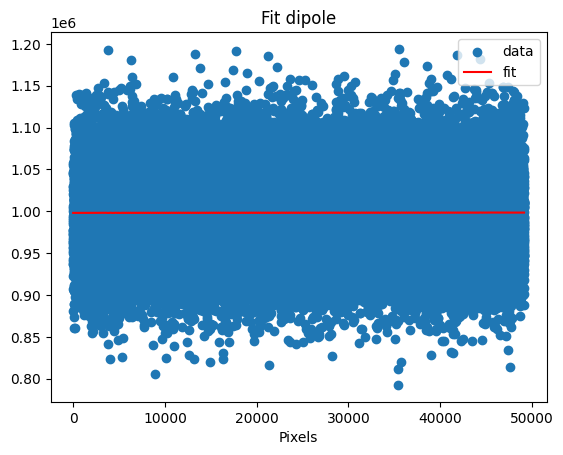

In [27]:
counts = sample_counts(NSource_px_Cl, Nbar=NSource_px_th, mode="", lognormal=lognormal)
title="Nb. of sources in clustering without shot noise"
hp.projview(counts, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, counts, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

┌─────────────────────────────────────────────────────────────────────────┐
│                                Migrad                                   │
├──────────────────────────────────┬──────────────────────────────────────┤
│ FCN = 1.117e+08 (χ²/ndof = 2272.0)│              Nfcn = 339              │
│ EDM = 7.19e-06 (Goal: 0.0002)    │            time = 2.9 sec            │
├──────────────────────────────────┼──────────────────────────────────────┤
│          Valid Minimum           │   Below EDM threshold (goal x 10)    │
├──────────────────────────────────┼──────────────────────────────────────┤
│     SOME parameters at limit     │           Below call limit           │
├──────────────────────────────────┼──────────────────────────────────────┤
│             Hesse ok             │         Covariance accurate          │
└──────────────────────────────────┴──────────────────────────────────────┘
┌───┬──────┬───────────┬───────────┬────────────┬────────────┬─────────┬─────────┬───────┐
│   │ Name │   Value   │ Hesse Err │ Minos Err- │ Minos Err+ │ Limit-  │ Limit+  │ Fixed │
├───┼──────┼───────────┼───────────┼────────────┼────────────┼─────────┼─────────┼───────┤
│ 0 │ M    │ 998.267e3 │  0.005e3  │  -0.005e3  │  0.005e3   │    0    │         │       │
│ 1 │ A    │  3.500e3  │  0.008e3  │  -0.008e3  │  0.008e3   │    0    │         │       │
│ 2 │ l    │359.999999991│0.002776525│-0.002810202│0.000000009 │    0    │   360   │       │
│ 3 │ b    │   -2.71   │   0.13    │   -0.13    │    0.13    │   -90   │   90    │       │
└───┴──────┴───────────┴───────────┴────────────┴────────────┴─────────┴─────────┴───────┘
┌──────────┬───────────────────────┬───────────────────────┬───────────────────────┬───────────────────────┐
│          │           M           │           A           │           l           │           b           │
├──────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┼───────────┬───────────┤
│  Error   │    -5     │     5     │    -8     │     8     │-2810202e-9│   9e-9    │   -0.13   │   0.13    │
│  Valid   │   True    │   True    │   True    │   True    │   True    │   True    │   True    │   True    │
│ At Limit │   False   │   False   │   False   │   False   │   False   │   True    │   False   │   False   │
│ Max FCN  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
│ New Min  │   False   │   False   │   False   │   False   │   False   │   False   │   False   │   False   │
└──────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┴───────────┘
┌───┬─────────────────────────────────────────┐
│   │         M         A         l         b │
├───┼─────────────────────────────────────────┤
│ M │      20.3         0   1.04e-9     0.000 │
│ A │         0      60.9 442.00e-9     0.007 │
│ l │   1.04e-9 442.00e-9  9.69e-11   0.47e-9 │
│ b │     0.000     0.007   0.47e-9    0.0163 │
└───┴─────────────────────────────────────────┘

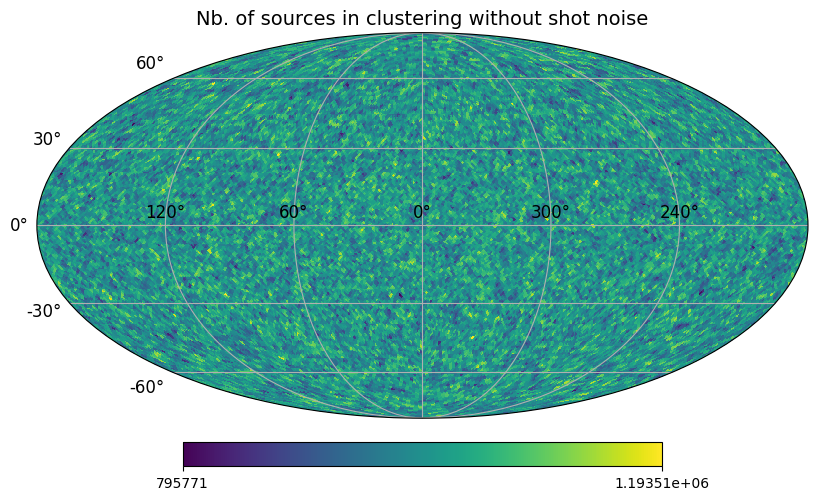

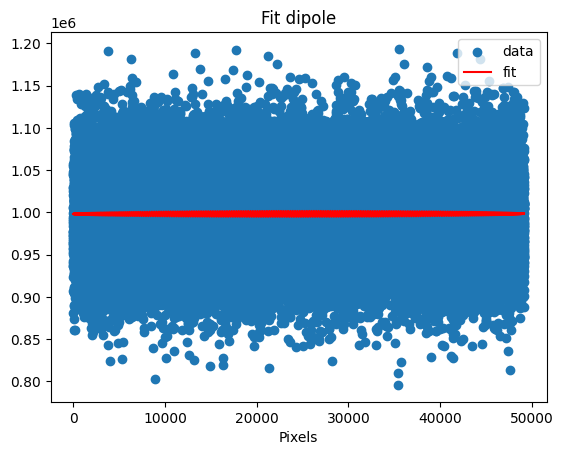

In [28]:
dipole_amp = 3700
nest = False
#NSource_px_dipole = inject_dipole(NSource_px_Cl, nside, dipole_amp)
NSource_px_dipole = apply_dipole_MD(counts, counts, dipole_amp, 0, 0, nest=nest)

title="Nb. of sources in clustering without shot noise"
hp.projview(NSource_px_dipole, title=title, graticule=True, graticule_labels=True)

model = lambda map, M, A, ra, dec : apply_dipole_MD(map, M, A, ra, dec, nest=nest, frame='icrs')
init =  (1000, 3, 20, 40)
names = ("M", "A", "l", "b")
m = fit_dipole_err(model, NSource_px_dipole, init, names, bounds=([0, 0, 0, -90], [np.inf, np.inf, 360, 90]))
m

## Comparing build_nz

/home/victoria/miniconda3/envs/M2Stage/lib/python3.10/site-packages/pyccl/errors.py:22: CCLWarning: Nchi must be a positive integer. Setting to match tracer with fewest chi samples.
  warnings_builtin.warn(*args, **kwargs)
/home/victoria/miniconda3/envs/M2Stage/lib/python3.10/site-packages/pyccl/errors.py:22: CCLWarning: chi_min must be greater than zero.Setting to default 1e-6 Mpc.
  warnings_builtin.warn(*args, **kwargs)


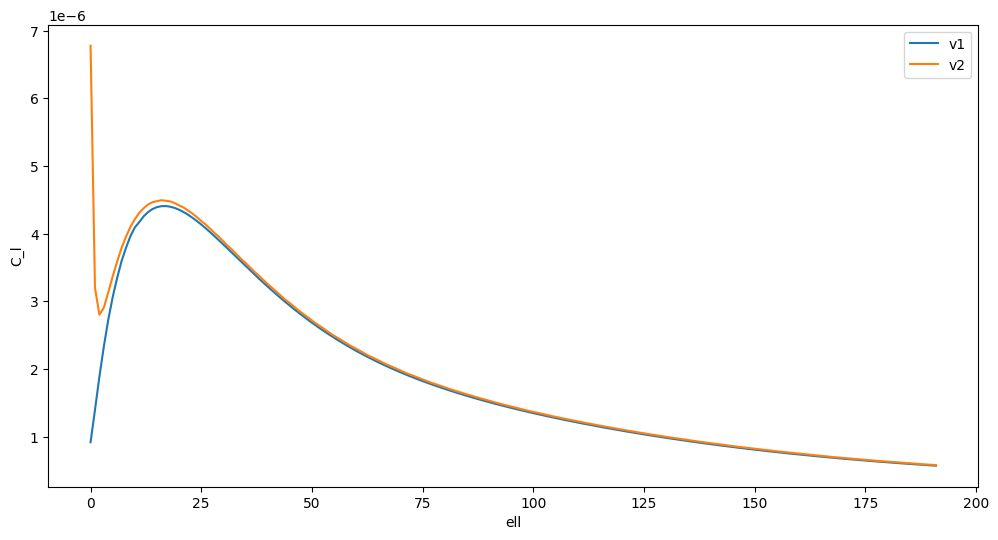

In [2]:
import pyccl as ccl
import matplotlib.pyplot as plt

from simulMap import *
from fitMap import *
from cluster import *


def build_nz_v1(zmin, zmax, size):
    z = np.linspace(0.01, zmax, size)
    nz = nz_model(z)
    nz[z < zmin] = 0
    nz /= np.trapz(nz, z)
    return z, nz


def build_nz_v2(zmin, zmax, size):
    z = np.linspace(zmin, zmax, size)
    #z = np.logspace(np.log10(zmin), np.log10(zmax), size)
    nz = nz_model(z)
    nz /= np.trapz(nz, z)
    return z, nz


def build_nz_v3(zmin, zmax, size):
    z_inner = np.linspace(zmin, zmax, size)
    nz_inner = nz_model(z_inner)
    
    # On force proprement le "découpage" en ajoutant des zéros aux bords
    z = np.concatenate([[zmin - 1e-5], z_inner, [zmax + 1e-5]])
    nz = np.concatenate([[0.0], nz_inner, [0.0]])
    
    nz /= np.trapz(nz, z)
    return z, nz


def build_nz_v3_fixed(zmin, zmax, size):
    # 1. On crée une grille fine pour la zone active (où il y a des galaxies)
    z_active = np.linspace(zmin, zmax, size)
    nz_active = nz_model(z_active)
    
    # 2. On force un point à 0 juste avant zmin et juste après zmax
    # pour définir proprement la coupure physique
    z_bords = np.array([zmin - 1e-4, zmax + 1e-4])
    nz_bords = np.array([0.0, 0.0])
    
    # 3. CRUCIAL POUR l=1,2 : On ajoute le point z=0 pour l'intégrateur non-Limber
    # Si zmin est déjà très proche de 0 (ex: 0.05), pas besoin. Si zmin = 0.5, c'est vital.
    z_zero = np.array([0.0])
    nz_zero = np.array([0.0])
    
    # On fusionne le tout proprement
    z = np.concatenate([z_zero, [zmin - 1e-4], z_active, [zmax + 1e-4]])
    nz = np.concatenate([nz_zero, [0.0], nz_active, [0.0]])
    
    # Tri au cas où zmin-1e-4 se rapproche trop de 0
    idx = np.argsort(z)
    z = z[idx]
    nz = nz[idx]
    
    # Normalisation
    nz /= np.trapz(nz, z)
    return z, nz

nside = 64
zmax = 1

cl1, ell1 = get_Cl_ccl(nside, get_ell=True, build_nz=build_nz_v1, zmax=zmax)
cl2, ell2 = get_Cl_ccl(nside, get_ell=True, build_nz=build_nz_v2, zmax=zmax)
cl3, ell3 = get_Cl_ccl(nside, get_ell=True, build_nz=build_nz_v3_fixed, zmax=zmax)

mask = ell1 < np.inf

plt.figure(figsize=[12, 6])
plt.plot(ell1[mask], cl1[mask], label="v1")
plt.plot(ell2[mask], cl2[mask], label="v2")
#plt.plot(ell3[mask], cl3[mask], label="v3")
plt.xlabel('ell')
plt.ylabel('C_l')
plt.legend();